# **Models' Results using Sub-Datasets**

##### *Imports*

In [167]:
# Packages
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns
# For ML 
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import f_classif, mutual_info_classif
from model_utils import *
# Pandas' options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### **General Game Results**

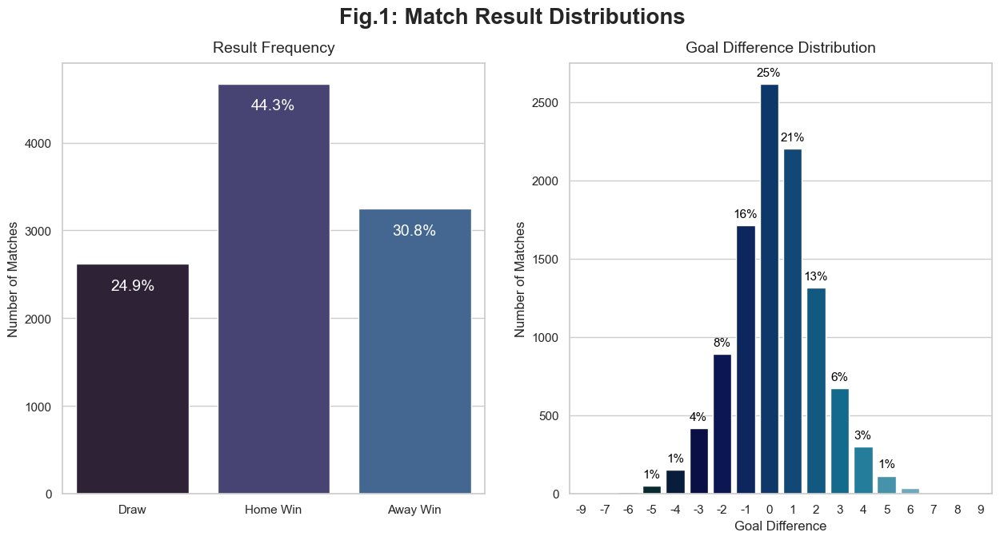

In [168]:
# Import Data
df_for_plot = pd.read_csv('../../Data/Modeling_Before_Preparation/Team_attributes_and_Rest_data_v01.csv').set_index('id')
# Style, figure and overall title
sns.set_theme(style="whitegrid", palette='mako')
fig, (ax, ax2) = plt.subplots(1,2, figsize=(15, 7))
fig.suptitle('Fig.1: Match Result Distributions', fontsize=20, weight='bold')

# Count plot with percentage annotation for match results
ax = sns.countplot(x = df_for_plot['result'], ax=ax)
for p in ax.patches:
    ax.annotate((str(round((p.get_height() / len(df_for_plot))*100, 1)) + '%'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', color='white', size=14, xytext = (0, -20), textcoords = 'offset points')
# Axes labels and title for the 1st subplot
ax.set(xticklabels = (['Draw', 'Home Win', 'Away Win']), xlabel=None, ylabel='Number of Matches')
ax.set_title('Result Frequency', fontsize=14, pad=10)

# Count plot with percentage annotation for goal differences
goal_diff = df_for_plot['goal_diff'].astype('category')
ax2 = sns.countplot(x=goal_diff, palette='ocean', ax=ax2)
for p in ax2.patches:
    if round((p.get_height() / len(goal_diff))*100) != 0:
        ax2.annotate((str(round((p.get_height() / len(goal_diff))*100)) + '%'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', color='black', size=11, xytext = (0, 10), textcoords = 'offset points')
# Axes labels and title for the 2nd subplot
ax2.set(xlabel='Goal Difference', ylabel='Number of Matches')
ax2.set_title('Goal Difference Distribution', fontsize=14, pad=10)

plt.show()

### **Compare Models using Different Sub-Datasets**

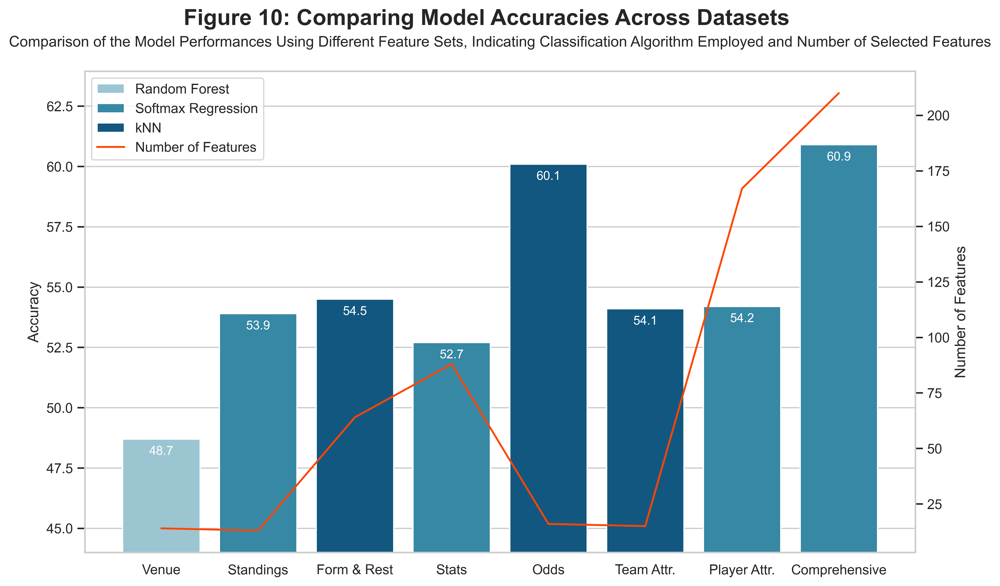

In [169]:
models_results = {
    'Names': ['Venue', 'Standings', 'Form & Rest', 'Stats', 'Odds', 'Team Attr.', 'Player Attr.', 'Comprehensive'],
    'Accuracy': [48.7, 53.9, 54.5, 52.7, 60.1, 54.1, 54.2, 60.9],
    'Algorithm': ['Random Forest', 'Softmax Regression', 'kNN', 'Softmax Regression', 'kNN', 'kNN', 'Softmax Regression', 'Softmax Regression'], 
    'Num_features': [14, 13, 64, 88, 16, 15, 167, 210],
    'Feature_selection': ['Mutual Info', 'F-test', 'RF-based', 'F-test', 'RF-based', 'F-test', 'None', 'RF-based']
    }
df_compare = pd.DataFrame(models_results)

# Style
sns.set_theme(style="whitegrid", palette='ocean_r')
fig, ax = plt.subplots(figsize=(12, 7), dpi=500)

# Barplot + Annotate
sns.barplot(x='Names', y='Accuracy', hue='Algorithm', data=df_compare, dodge=False, ax=ax)
for p in ax.patches:
    ax.annotate(p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', color='white', size=10, xytext = (0, -10), textcoords = 'offset points')
# Add labels and title
handles, labels = ax.get_legend_handles_labels()
ax.set(xlabel=None, ylabel='Accuracy', ylim=44)
plt.suptitle('Figure 10: Comparing Model Accuracies Across Datasets', weight='bold', fontsize=18)
ax.set_title('Comparison of the Model Performances Using Different Feature Sets, Indicating Classification Algorithm Employed and Number of Selected Features',  fontsize=12, pad=20)

# Lineplot
ax2 = ax.twinx()
l2 = sns.lineplot(x='Names', y='Num_features', data=df_compare, ax=ax2, color='orangered', label='Number of Features', legend=False)
ax2.set(ylabel='Number of Features')
ax2.grid(None)
handles2, labels2 = ax2.get_legend_handles_labels()
# Legend
ax.legend(handles=handles+handles2,labels=labels+labels2)

plt.show()

### **Venue Sub-Dataset**

##### *Data Import and Preparation*

In [170]:
# Import Data
venue_df = pd.read_csv('../../Data/Modeling_Final/1_venue.csv').set_index('id')
# Assign correct data types 
categorial_columns = ['result', 'colors_home_color','colors_away_color', 'league_id', 'season_id', 'venue_id', 'venue_city', 'season_name_codes', 'home_country_id', 'venue_surface_isgrass', 'night_game', 'home_not_home', 'travel_outside_state']
venue_df[categorial_columns] = venue_df[categorial_columns].astype('category')
categorial_columns.remove('result')
# Downcast data types
float_cols = venue_df.select_dtypes(np.float_).columns.tolist()
int_cols = venue_df.select_dtypes(np.int_).columns.tolist()
numeric_columns = float_cols + int_cols
venue_df.loc[:, float_cols] = venue_df.loc[:, float_cols].apply(pd.to_numeric, downcast='float')
venue_df.loc[:, int_cols] = venue_df.loc[:, int_cols].apply(pd.to_numeric, downcast='integer')

print(venue_df.shape)
venue_df.head(2)

(10536, 24)


,result,league_id,season_id,venue_id,venue_city,attendance,venue_capacity,home_country_id,venue_surface_isgrass,temp,cloudcover,humidity,pressure,visibility,winddir,windspeed,night_game,travel_dist(km),colors_home_color,colors_away_color,home_not_home,travel_outside_state,attendance_ratio,season_name_codes
id,,,,,,,,,,,,,,,,,,,,,,,,
251728,2,301,765,37,Furiani,13122,16078,17,1,23.9,27,48,1022,30,21,3.06,1,886,BL,W,0,0,0.816146,0
251738,0,301,765,4451,Monaco,8019,18523,75285,1,17.9,25,73,1014,10,312,0.92,1,977,RE,RE,0,1,0.432921,0


##### *EDA*

In [171]:
print(venue_df.info(verbose=False))
round(venue_df.describe(), 2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10536 entries, 251728 to 18157344
Columns: 24 entries, result to season_name_codes
dtypes: category(13), float32(3), int16(3), int32(2), int8(3)
memory usage: 548.7 KB
None


,attendance,venue_capacity,temp,cloudcover,humidity,pressure,visibility,winddir,windspeed,travel_dist(km),attendance_ratio
count,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00
mean,23180.36,39301.49,13.15,44.30,68.35,1015.36,14.73,191.53,3.58,370.55,0.59
std,19865.11,20326.33,7.18,35.53,18.75,9.28,10.08,101.52,2.81,290.08,0.36
min,0.00,1000.00,-13.50,0.00,1.00,945.00,0.00,0.00,0.00,0.00,0.00
25%,8137.00,23500.00,7.90,8.00,55.00,1011.00,10.00,105.00,1.61,179.00,0.32
50%,19597.50,34000.00,12.50,41.00,71.00,1016.00,10.00,208.00,3.06,316.00,0.67
75%,34534.75,53289.00,18.00,82.00,84.00,1021.00,18.00,271.00,4.83,495.00,0.91
max,98485.00,98787.00,37.20,100.00,100.00,1047.00,70.00,360.00,40.03,2907.00,1.00


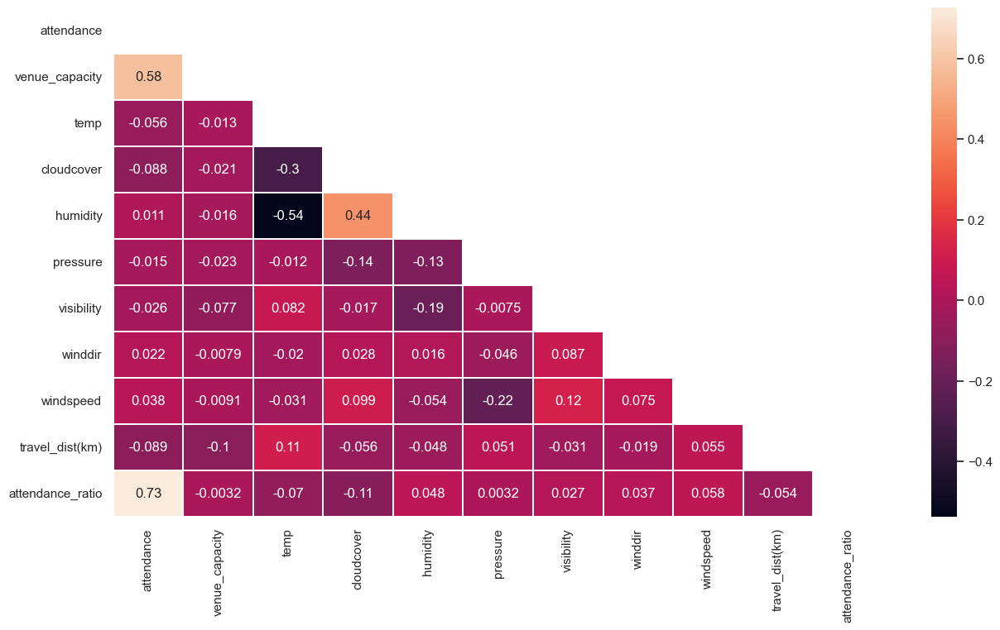

In [172]:
# Correlation Heatmap
corrmat = venue_df.corr()
top_corr_features = corrmat.index
matrix = np.triu(corrmat)
plt.figure(figsize=(15, 8))
#plot heat map
g = sns.heatmap(venue_df[top_corr_features].corr(), mask=matrix, linewidths=0.15,annot=True)

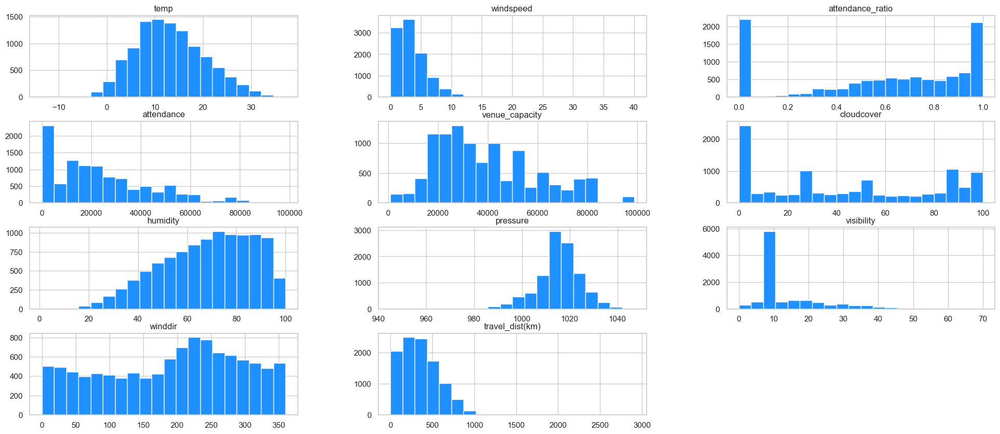

In [173]:
%matplotlib inline
venue_df[numeric_columns].hist(bins=20, figsize=(24,10), color = 'dodgerblue')
plt.show()

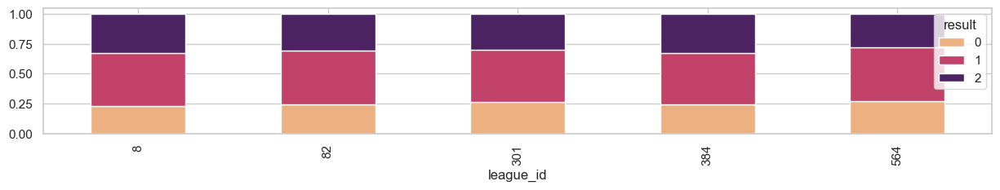

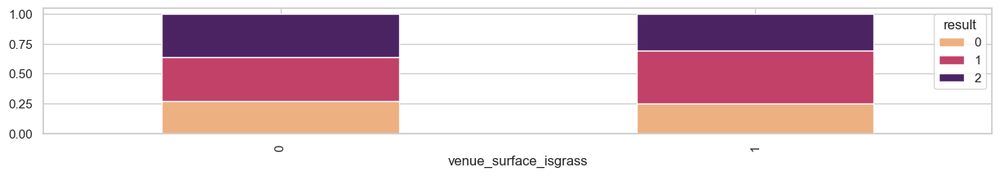

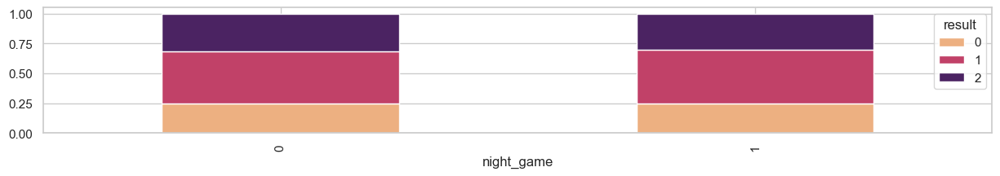

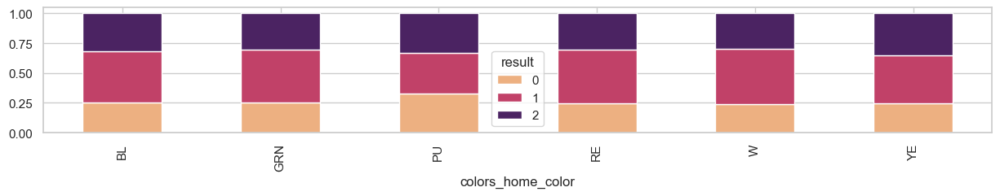

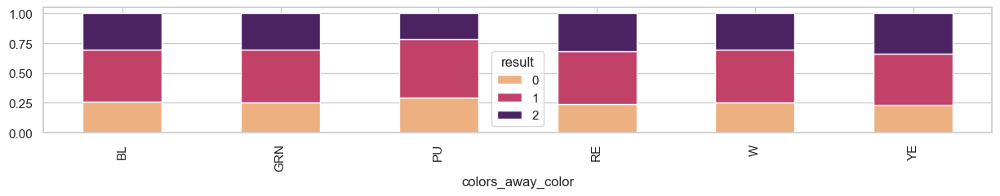

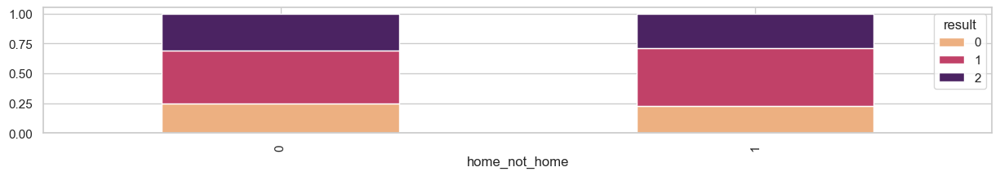

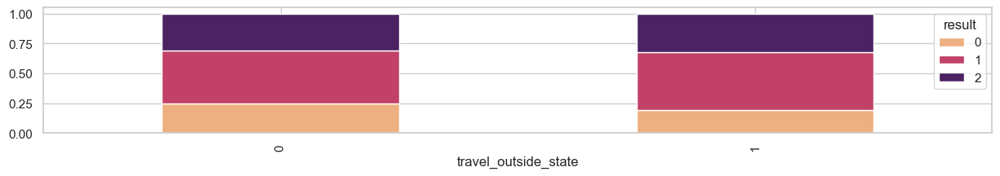

In [174]:
# Categorical variables by result
for cat_col in ['league_id','venue_surface_isgrass','night_game','colors_home_color','colors_away_color', 'home_not_home', 'travel_outside_state']:
    prop_table = pd.crosstab(index=venue_df[cat_col], columns=venue_df["result"], normalize="index")
    prop_table.plot(kind="bar",figsize=(15,2), stacked=True, colormap='flare')

In [175]:
num_for_plot = [['attendance','venue_capacity','attendance_ratio'],['temp','cloudcover', 'humidity'],['windspeed','winddir', 'travel_dist(km)']]
# Create subplots grid
fig = make_subplots(rows=3, cols=3)
# Add traces and update y-axes title
for ind, i in enumerate(num_for_plot):
    fig.add_trace(go.Box(x = venue_df['result'], y = venue_df[i[0]], name = i[0]), row = ind + 1, col = 1)
    fig.add_trace(go.Box(x = venue_df['result'], y = venue_df[i[1]], name = i[1]), row = ind + 1, col = 2)
    fig.add_trace(go.Box(x = venue_df['result'], y = venue_df[i[2]], name = i[2]), row = ind + 1, col = 3)
fig.show()  

##### **Best Model**

In [176]:
# Split train and test sets
X = venue_df.loc[:, 'league_id':]
y = venue_df['result'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=14, stratify=y)
# Sets shape
print(f'X train shape: {X_train.shape}. Y train shape: {y_train.shape}\nX test shape: {X_test.shape}. Y test shape: {y_test.shape}')

# Pre-processing techniques
full_pipeline_ord = ColumnTransformer([
    ('num', StandardScaler(), numeric_columns),
    ('cat_hot', OrdinalEncoder(), categorial_columns)], 
    remainder='passthrough') # Standard scaler + Ordinal encoding
X_tr_ord = full_pipeline_ord.fit_transform(X_train)
X_te_ord = full_pipeline_ord.transform(X_test)
print(f'X_tr_std Shape: {X_tr_ord.shape}. X_te_std Shape: {X_tr_ord.shape}')

X train shape: (8955, 23). Y train shape: (8955,)
X test shape: (1581, 23). Y test shape: (1581,)
X_tr_std Shape: (8955, 23). X_te_std Shape: (8955, 23)


Test Accuracy:  0.4876660341555977


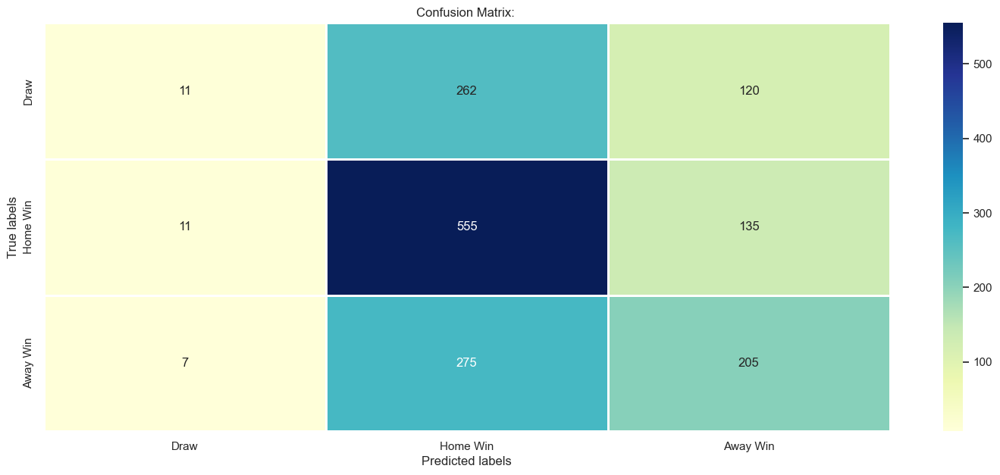

In [177]:
# Feature selection
X_train_fs, X_test_fs, fs = select_features_mutual(X_tr_ord, y_train, X_te_ord, 22)
# Model
top_model = RandomForestClassifier(max_depth=20, min_samples_leaf=10, min_samples_split=7,n_estimators=500, random_state=14)
top_model.fit(X_train_fs, y_train)           
y_pred = top_model.predict(X_test_fs)
# Model's Accuracy and Confusion Matrix
print('Test Accuracy: ', metrics.accuracy_score(y_test, y_pred))
plot_confusion_matrix(y_pred, y_test, color_map='YlGnBu')

Feature Importance

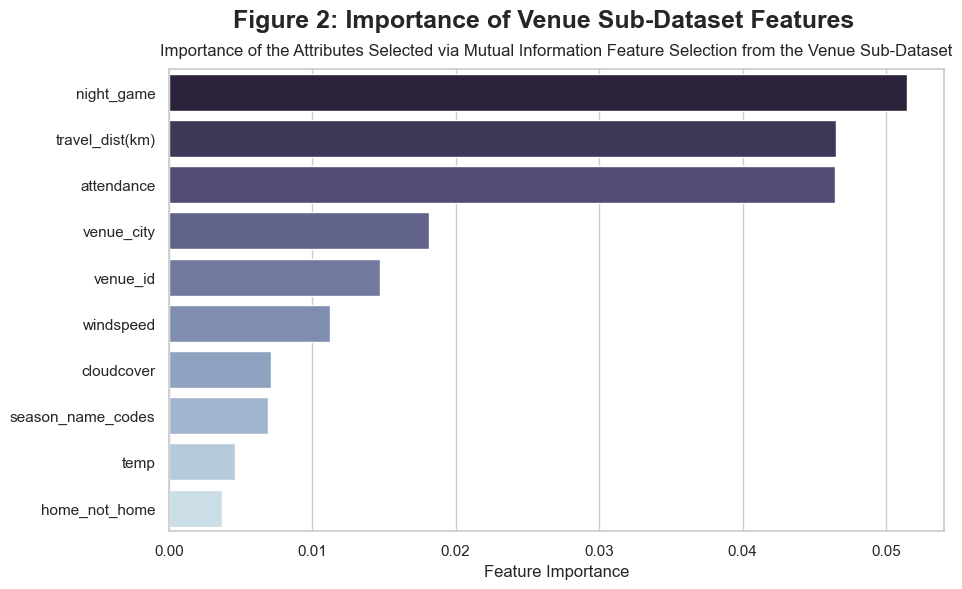

In [178]:
# Compute mutual information importance scores
mi = mutual_info_classif(X_tr_ord, y_train)
feature_names = np.array(X_train.columns.tolist())
sorted_indices = np.argsort(mi)[::-1][:10]
top_10_feature_names = feature_names[sorted_indices]
df = pd.DataFrame({'Feature Names': top_10_feature_names, 'Feature Importance': mi[sorted_indices]})

# Plot 
plt.figure(figsize=(10,6), dpi=100)
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df['Feature Importance'], y=df['Feature Names'], orient='h', palette="ch:s=.25,rot=-.25_r")
ax.set(xlabel='Feature Importance', ylabel=None)
plt.suptitle('Figure 2: Importance of Venue Sub-Dataset Features', weight='bold', fontsize=18)
ax.set_title('Importance of the Attributes Selected via Mutual Information Feature Selection from the Venue Sub-Dataset',  fontsize=12, pad=10)
plt.show()

### **Standings Sub-Dataset**

##### *Data Import and Preparation*

In [179]:
# Import Data
standings_df = pd.read_csv('../../Data/Modeling_Final/2_standings.csv').set_index('id')
# Categorical columns
rank_cols = standings_df.filter(regex='rank').columns.tolist() + ['ROUND']
categorical_cols = ['result', 'league_id', 'season_id', 'season_name_codes'] 
standings_df[rank_cols + categorical_cols] = standings_df[rank_cols + categorical_cols].astype('category')
categorical_cols.remove('result')
# Numeric columns
float_cols = standings_df.select_dtypes(np.float_).columns.tolist()
int_cols = standings_df.select_dtypes(np.int_).columns.tolist()
standings_df.loc[:, float_cols] = standings_df.loc[:, float_cols].apply(pd.to_numeric, downcast='float')
standings_df.loc[:, int_cols] = standings_df.loc[:, int_cols].apply(pd.to_numeric, downcast='integer')
numeric_cols = float_cols + int_cols

print(standings_df.shape)
standings_df.head(2)

(10536, 185)


,result,league_id,season_id,ROUND,Won_FT_TO_H,Drawn_FT_TO_H,Lost_FT_TO_H,GF_FT_TO_H,GA_FT_TO_H,GD_FT_TO_H,Points_FT_TO_H,rank_FT_TO_H,W%_FT_TO_H,D%_FT_TO_H,L%_FT_TO_H,GFxGame_FT_TO_H,GAxGame_FT_TO_H,GDxGame_FT_TO_H,PointsxGame_FT_TO_H,Won_1H_TO_H,Drawn_1H_TO_H,Lost_1H_TO_H,GF_1H_TO_H,GA_1H_TO_H,GD_1H_TO_H,Points_1H_TO_H,rank_1H_TO_H,W%_1H_TO_H,D%_1H_TO_H,L%_1H_TO_H,GFxGame_1H_TO_H,GAxGame_1H_TO_H,GDxGame_1H_TO_H,PointsxGame_1H_TO_H,Won_2H_TO_H,Drawn_2H_TO_H,Lost_2H_TO_H,GF_2H_TO_H,GA_2H_TO_H,GD_2H_TO_H,Points_2H_TO_H,rank_2H_TO_H,W%_2H_TO_H,D%_2H_TO_H,L%_2H_TO_H,GFxGame_2H_TO_H,GAxGame_2H_TO_H,GDxGame_2H_TO_H,PointsxGame_2H_TO_H,Won_FT_TO_A,Drawn_FT_TO_A,Lost_FT_TO_A,GF_FT_TO_A,GA_FT_TO_A,GD_FT_TO_A,Points_FT_TO_A,rank_FT_TO_A,W%_FT_TO_A,D%_FT_TO_A,L%_FT_TO_A,GFxGame_FT_TO_A,GAxGame_FT_TO_A,GDxGame_FT_TO_A,PointsxGame_FT_TO_A,Won_1H_TO_A,Drawn_1H_TO_A,Lost_1H_TO_A,GF_1H_TO_A,GA_1H_TO_A,GD_1H_TO_A,Points_1H_TO_A,rank_1H_TO_A,W%_1H_TO_A,D%_1H_TO_A,L%_1H_TO_A,GFxGame_1H_TO_A,GAxGame_1H_TO_A,GDxGame_1H_TO_A,PointsxGame_1H_TO_A,Won_2H_TO_A,Drawn_2H_TO_A,Lost_2H_TO_A,GF_2H_TO_A,GA_2H_TO_A,GD_2H_TO_A,Points_2H_TO_A,rank_2H_TO_A,W%_2H_TO_A,D%_2H_TO_A,L%_2H_TO_A,GFxGame_2H_TO_A,GAxGame_2H_TO_A,GDxGame_2H_TO_A,PointsxGame_2H_TO_A,Won_FT_OH_H,Drawn_FT_OH_H,Lost_FT_OH_H,GF_FT_OH_H,GA_FT_OH_H,GD_FT_OH_H,Points_FT_OH_H,rank_FT_OH_H,W%_FT_OH_H,D%_FT_OH_H,L%_FT_OH_H,GFxGame_FT_OH_H,GAxGame_FT_OH_H,GDxGame_FT_OH_H,PointsxGame_FT_OH_H,Won_1H_OH_H,Drawn_1H_OH_H,Lost_1H_OH_H,GF_1H_OH_H,GA_1H_OH_H,GD_1H_OH_H,Points_1H_OH_H,rank_1H_OH_H,W%_1H_OH_H,D%_1H_OH_H,L%_1H_OH_H,GFxGame_1H_OH_H,GAxGame_1H_OH_H,GDxGame_1H_OH_H,PointsxGame_1H_OH_H,Won_2H_OH_H,Drawn_2H_OH_H,Lost_2H_OH_H,GF_2H_OH_H,GA_2H_OH_H,GD_2H_OH_H,Points_2H_OH_H,rank_2H_OH_H,W%_2H_OH_H,D%_2H_OH_H,L%_2H_OH_H,GFxGame_2H_OH_H,GAxGame_2H_OH_H,GDxGame_2H_OH_H,PointsxGame_2H_OH_H,Won_FT_OA_A,Drawn_FT_OA_A,Lost_FT_OA_A,GF_FT_OA_A,GA_FT_OA_A,GD_FT_OA_A,Points_FT_OA_A,rank_FT_OA_A,W%_FT_OA_A,D%_FT_OA_A,L%_FT_OA_A,GFxGame_FT_OA_A,GAxGame_FT_OA_A,GDxGame_FT_OA_A,PointsxGame_FT_OA_A,Won_1H_OA_A,Drawn_1H_OA_A,Lost_1H_OA_A,GF_1H_OA_A,GA_1H_OA_A,GD_1H_OA_A,Points_1H_OA_A,rank_1H_OA_A,W%_1H_OA_A,D%_1H_OA_A,L%_1H_OA_A,GFxGame_1H_OA_A,GAxGame_1H_OA_A,GDxGame_1H_OA_A,PointsxGame_1H_OA_A,Won_2H_OA_A,Drawn_2H_OA_A,Lost_2H_OA_A,GF_2H_OA_A,GA_2H_OA_A,GD_2H_OA_A,Points_2H_OA_A,rank_2H_OA_A,W%_2H_OA_A,D%_2H_OA_A,L%_2H_OA_A,GFxGame_2H_OA_A,GAxGame_2H_OA_A,GDxGame_2H_OA_A,PointsxGame_2H_OA_A,season_name_codes
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
251728,2,301,765,0,12,8,16,33,41,-8,44,14,0.333333,0.222222,0.444444,0.916667,1.138889,-0.222222,1.222222,7,20,9,14,14,0,41,14,0.194444,0.555556,0.250000,0.388889,0.388889,0.0,1.138889,10,12,14,19,27,-8,42,15,0.277778,0.333333,0.388889,0.527778,0.750000,-0.222222,1.166667,27,5,2,89,18,71,86,1,0.794118,0.147059,0.058824,2.617647,0.529412,2.088235,2.529412,17,15,2,35,10,25,66,1,0.500000,0.441176,0.058824,1.029412,0.294118,0.735294,1.941176,24,7,3,54,8,46,79,1,0.705882,0.205882,0.088235,1.588235,0.235294,1.352941,2.323529,10,2,6,22,14,8,32,7,0.555556,0.111111,0.333333,1.222222,0.777778,0.444444,1.777778,5,10,3,10,5,5,25,9,0.277778,0.555556,0.166667,0.555556,0.277778,0.277778,1.388889,8,5,5,12,9,3,29,5,0.444444,0.277778,0.277778,0.666667,0.500000,0.166667,1.611111,14,2,1,38,6,32,44,1,0.823529,0.117647,0.058824,2.235294,0.352941,1.882353,2.588235,4,11,2,10,4,6,23,6,0.235294,0.647059,0.117647,0.588235,0.235294,0.352941,1.352941,14,2,1,28,2,26,44,1,0.823529,0.117647,0.058824,1.647059,0.117647,1.529412,2.588235,0
251738,0,301,765,0,16,14,7,55,50,5,62,3,0.432432,0.378378,0.189189,1.486486,1.351351,0.135135,1.675676,13,13,11,22,22,0,52,8,0.351351,0.351351,0.297297,0.594595,0.594595,0.0,1.405405,13,13,11,33,28,5,52,7,0.351351,0.351351,0.297297,0.891892,0.756757,0.135135,1.405405,11,10,15,45,53,-8,43,15,0.305556,0.277778,0.416667,1.250000

##### *EDA*

In [180]:
print(standings_df.info(verbose=False))
round(standings_df.describe(), 2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10536 entries, 251728 to 18157344
Columns: 185 entries, result to season_name_codes
dtypes: category(17), float32(84), int8(84)
memory usage: 4.5 MB
None


,Won_FT_TO_H,Drawn_FT_TO_H,Lost_FT_TO_H,GF_FT_TO_H,GA_FT_TO_H,GD_FT_TO_H,Points_FT_TO_H,W%_FT_TO_H,D%_FT_TO_H,L%_FT_TO_H,GFxGame_FT_TO_H,GAxGame_FT_TO_H,GDxGame_FT_TO_H,PointsxGame_FT_TO_H,Won_1H_TO_H,Drawn_1H_TO_H,Lost_1H_TO_H,GF_1H_TO_H,GA_1H_TO_H,GD_1H_TO_H,Points_1H_TO_H,W%_1H_TO_H,D%_1H_TO_H,L%_1H_TO_H,GFxGame_1H_TO_H,GAxGame_1H_TO_H,GDxGame_1H_TO_H,PointsxGame_1H_TO_H,Won_2H_TO_H,Drawn_2H_TO_H,Lost_2H_TO_H,GF_2H_TO_H,GA_2H_TO_H,GD_2H_TO_H,Points_2H_TO_H,W%_2H_TO_H,D%_2H_TO_H,L%_2H_TO_H,GFxGame_2H_TO_H,GAxGame_2H_TO_H,GDxGame_2H_TO_H,PointsxGame_2H_TO_H,Won_FT_TO_A,Drawn_FT_TO_A,Lost_FT_TO_A,GF_FT_TO_A,GA_FT_TO_A,GD_FT_TO_A,Points_FT_TO_A,W%_FT_TO_A,D%_FT_TO_A,L%_FT_TO_A,GFxGame_FT_TO_A,GAxGame_FT_TO_A,GDxGame_FT_TO_A,PointsxGame_FT_TO_A,Won_1H_TO_A,Drawn_1H_TO_A,Lost_1H_TO_A,GF_1H_TO_A,GA_1H_TO_A,GD_1H_TO_A,Points_1H_TO_A,W%_1H_TO_A,D%_1H_TO_A,L%_1H_TO_A,GFxGame_1H_TO_A,GAxGame_1H_TO_A,GDxGame_1H_TO_A,PointsxGame_1H_TO_A,Won_2H_TO_A,Drawn_2H_TO_A,Lost_2H_TO_A,GF_2H_TO_A,GA_2H_TO_A,GD_2H_TO_A,Points_2H_TO_A,W%_2H_TO_A,D%_2H_TO_A,L%_2H_TO_A,GFxGame_2H_TO_A,GAxGame_2H_TO_A,GDxGame_2H_TO_A,PointsxGame_2H_TO_A,Won_FT_OH_H,Drawn_FT_OH_H,Lost_FT_OH_H,GF_FT_OH_H,GA_FT_OH_H,GD_FT_OH_H,Points_FT_OH_H,W%_FT_OH_H,D%_FT_OH_H,L%_FT_OH_H,GFxGame_FT_OH_H,GAxGame_FT_OH_H,GDxGame_FT_OH_H,PointsxGame_FT_OH_H,Won_1H_OH_H,Drawn_1H_OH_H,Lost_1H_OH_H,GF_1H_OH_H,GA_1H_OH_H,GD_1H_OH_H,Points_1H_OH_H,W%_1H_OH_H,D%_1H_OH_H,L%_1H_OH_H,GFxGame_1H_OH_H,GAxGame_1H_OH_H,GDxGame_1H_OH_H,PointsxGame_1H_OH_H,Won_2H_OH_H,Drawn_2H_OH_H,Lost_2H_OH_H,GF_2H_OH_H,GA_2H_OH_H,GD_2H_OH_H,Points_2H_OH_H,W%_2H_OH_H,D%_2H_OH_H,L%_2H_OH_H,GFxGame_2H_OH_H,GAxGame_2H_OH_H,GDxGame_2H_OH_H,PointsxGame_2H_OH_H,Won_FT_OA_A,Drawn_FT_OA_A,Lost_FT_OA_A,GF_FT_OA_A,GA_FT_OA_A,GD_FT_OA_A,Points_FT_OA_A,W%_FT_OA_A,D%_FT_OA_A,L%_FT_OA_A,GFxGame_FT_OA_A,GAxGame_FT_OA_A,GDxGame_FT_OA_A,PointsxGame_FT_OA_A,Won_1H_OA_A,Drawn_1H_OA_A,Lost_1H_OA_A,GF_1H_OA_A,GA_1H_OA_A,GD_1H_OA_A,Points_1H_OA_A,W%_1H_OA_A,D%_1H_OA_A,L%_1H_OA_A,GFxGame_1H_OA_A,GAxGame_1H_OA_A,GDxGame_1H_OA_A,PointsxGame_1H_OA_A,Won_2H_OA_A,Drawn_2H_OA_A,Lost_2H_OA_A,GF_2H_OA_A,GA_2H_OA_A,GD_2H_OA_A,Points_2H_OA_A,W%_2H_OA_A,D%_2H_OA_A,L%_2H_OA_A,GFxGame_2H_OA_A,GAxGame_2H_OA_A,GDxGame_2H_OA_A,PointsxGame_2H_OA_A
count,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.0,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.0,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00
mean,6.88,4.66,6.93,25.46,25.56,-0.10,25.31,0.37,0.25,0.38,1.37,1.40,-0.02,1.36,5.39,7.66,5.42,11.13,11.18,-0.05,23.83,0.29,0.42,0.30,0.60,0.61,-0.01,1.28,6.10,6.24,6.13,14.33,14.38,-0.05,24.54,0.33,0.34,0.33,0.78,0.79,-0.01,1.

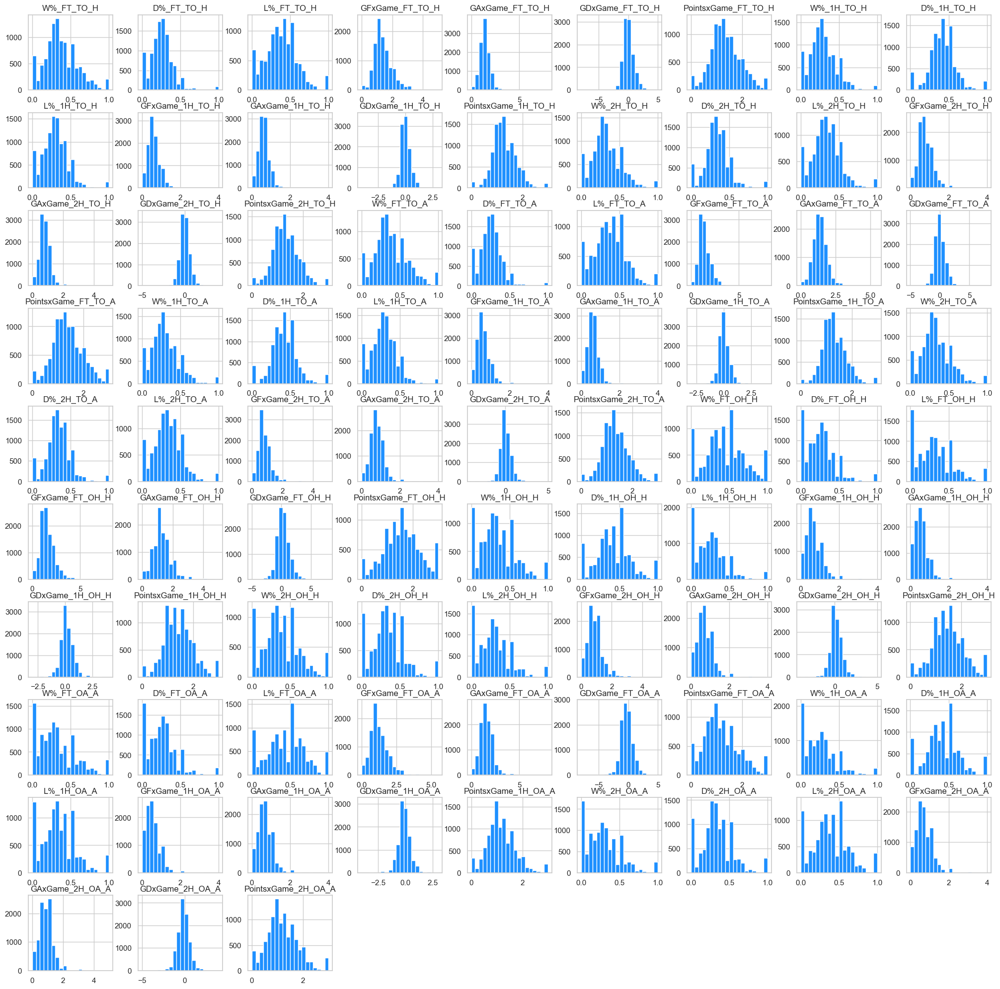

In [181]:
%matplotlib inline
standings_df[float_cols].hist(bins=20, figsize=(25,25), color = 'dodgerblue')
plt.show() 

##### **Best Model**

In [182]:
# Split train and test sets
X = standings_df.loc[:, 'league_id':]
y = standings_df['result'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=14, stratify=y)
# Sets shape
print(f'X train shape: {X_train.shape}. Y train shape: {y_train.shape}\nX test shape: {X_test.shape}. Y test shape: {y_test.shape}')

# Pre-processing techniques
full_pipeline_ord_mms = ColumnTransformer([
    ('num', MinMaxScaler(), numeric_cols),
    ('cat_ord', OrdinalEncoder(), categorical_cols),
    ('rank', OrdinalEncoder(), rank_cols)
], remainder='passthrough') # MinMax scaler + Ordinal encoding
X_tr_ord_mms = full_pipeline_ord_mms.fit_transform(X_train)
X_te_ord_mms = full_pipeline_ord_mms.transform(X_test)
print(f'X_tr_ord_mms Shape: {X_tr_ord_mms.shape}. X_te_ord_mms Shape: {X_te_ord_mms.shape}')

X train shape: (8955, 184). Y train shape: (8955,)
X test shape: (1581, 184). Y test shape: (1581,)
X_tr_ord_mms Shape: (8955, 184). X_te_ord_mms Shape: (1581, 184)


Test Accuracy:  0.538899430740038


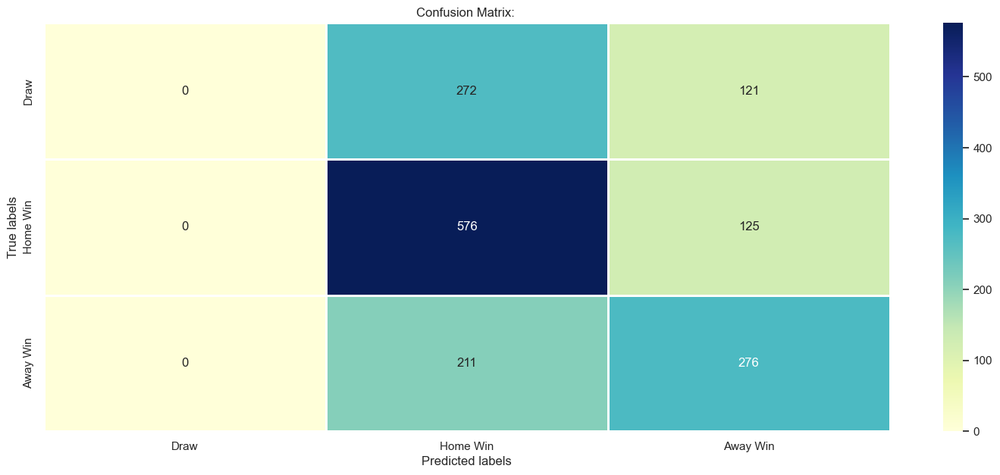

In [183]:
# Feature selection
X_train_fs, X_test_fs, fs = select_features_f(X_tr_ord_mms, y_train, X_te_ord_mms, 13)
# Model
top_model = LogisticRegression(C=1, max_iter=5000, multi_class='multinomial')
top_model.fit(X_train_fs, y_train)         
y_pred = top_model.predict(X_test_fs)
# Model's Accuracy and Confusion Matrix
print('Test Accuracy: ', metrics.accuracy_score(y_test, y_pred))
plot_confusion_matrix(y_pred, y_test, color_map='YlGnBu')

Feature Importance

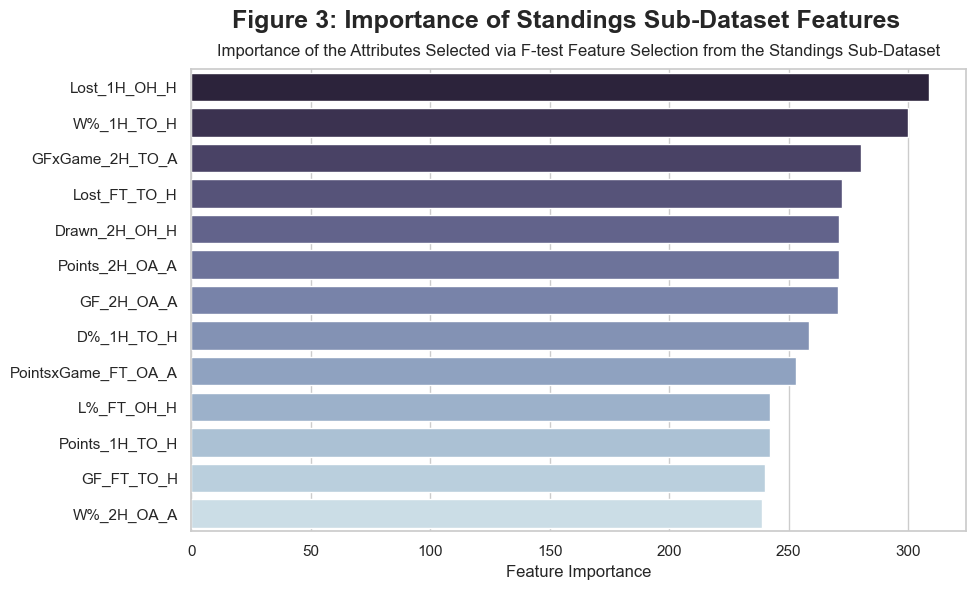

In [184]:
# Compute importance scores
f = f_classif(X_tr_ord_mms, y_train)[0]
feature_names = np.array(X_train.columns.tolist())
sorted_indices = np.argsort(f)[::-1][:13]
top_13_feature_names = feature_names[sorted_indices]
sorted_indices
df = pd.DataFrame({'Feature Names': top_13_feature_names, 'Feature Importance': f[sorted_indices]})

# Plot
plt.figure(figsize=(10,6), dpi=100)
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df['Feature Importance'], y=df['Feature Names'], orient='h', palette="ch:s=.25,rot=-.25_r")
ax.set(xlabel='Feature Importance', ylabel=None)
plt.suptitle('Figure 3: Importance of Standings Sub-Dataset Features', weight='bold', fontsize=18)
ax.set_title('Importance of the Attributes Selected via F-test Feature Selection from the Standings Sub-Dataset',  fontsize=12, pad=10)
plt.show()

### **Form & Rest Sub-Dataset**

##### *Data Import and Preparation*

In [185]:
# Import Data
form_df = pd.read_csv('../../Data/Modeling_Final/3_form_rest.csv').set_index('id')
# Assign data types
cat_cols = ['result', 'league_id', 'season_id', 'season_name_codes'] 
form_df[cat_cols] = form_df[cat_cols].astype(int).astype('category')
cat_cols.remove('result')
numerical_cols = form_df.select_dtypes(np.number).columns.tolist()
form_df.loc[:, numerical_cols] = form_df.loc[:, numerical_cols].apply(pd.to_numeric, downcast='float')

print(form_df.shape)
form_df.head(2)

(10438, 259)


,result,league_id,season_id,home_rest_days,away_rest_days,home_points_last1_games_withcups,home_points_last3_games_withcups,home_points_last5_games_withcups,home_points_last10_games_withcups,home_points_last20_games_withcups,away_points_last1_games_withcups,away_points_last3_games_withcups,away_points_last5_games_withcups,away_points_last10_games_withcups,away_points_last20_games_withcups,home_goals_scored_last1_games_withcups,home_goals_scored_last3_games_withcups,home_goals_scored_last5_games_withcups,home_goals_scored_last10_games_withcups,home_goals_scored_last20_games_withcups,away_goals_scored_last1_games_withcups,away_goals_scored_last3_games_withcups,away_goals_scored_last5_games_withcups,away_goals_scored_last10_games_withcups,away_goals_scored_last20_games_withcups,home_goals_conceded_last1_games_withcups,home_goals_conceded_last3_games_withcups,home_goals_conceded_last5_games_withcups,home_goals_conceded_last10_games_withcups,home_goals_conceded_last20_games_withcups,away_goals_conceded_last1_games_withcups,away_goals_conceded_last3_games_withcups,away_goals_conceded_last5_games_withcups,away_goals_conceded_last10_games_withcups,away_goals_conceded_last20_games_withcups,home_goals_diff_last1_games_withcups,home_goals_diff_last3_games_withcups,home_goals_diff_last5_games_withcups,home_goals_diff_last10_games_withcups,home_goals_diff_last20_games_withcups,away_goals_diff_last1_games_withcups,away_goals_diff_last3_games_withcups,away_goals_diff_last5_games_withcups,away_goals_diff_last10_games_withcups,away_goals_diff_last20_games_withcups,home_points_last1_games_nopcups,home_points_last3_games_nopcups,home_points_last5_games_nopcups,home_points_last10_games_nopcups,home_points_last20_games_nopcups,away_points_last1_games_nopcups,away_points_last3_games_nopcups,away_points_last5_games_nopcups,away_points_last10_games_nopcups,away_points_last20_games_nopcups,home_goals_scored_last1_games_nopcups,home_goals_scored_last3_games_nopcups,home_goals_scored_last5_games_nopcups,home_goals_scored_last10_games_nopcups,home_goals_scored_last20_games_nopcups,away_goals_scored_last1_games_nopcups,away_goals_scored_last3_games_nopcups,away_goals_scored_last5_games_nopcups,away_goals_scored_last10_games_nopcups,away_goals_scored_last20_games_nopcups,home_goals_conceded_last1_games_nopcups,home_goals_conceded_last3_games_nopcups,home_goals_conceded_last5_games_nopcups,home_goals_conceded_last10_games_nopcups,home_goals_conceded_last20_games_nopcups,away_goals_conceded_last1_games_nopcups,away_goals_conceded_last3_games_nopcups,away_goals_conceded_last5_games_nopcups,away_goals_conceded_last10_games_nopcups,away_goals_conceded_last20_games_nopcups,home_goals_diff_last1_games_nopcups,home_goals_diff_last3_games_nopcups,home_goals_diff_last5_games_nopcups,home_goals_diff_last10_games_nopcups,home_goals_diff_last20_games_nopcups,away_goals_diff_last1_games_nopcups,away_goals_diff_last3_games_nopcups,away_goals_diff_last5_games_nopcups,away_goals_diff_last10_games_nopcups,away_goals_diff_last20_games_nopcups,home_team_points_last1_games_withcups,home_team_points_last3_games_withcups,home_team_points_last5_games_withcups,home_team_points_last10_games_withcups,home_team_points_last20_games_withcups,home_team_goals_scored_last1_games_withcups,home_team_goals_scored_last3_games_withcups,home_team_goals_scored_last5_games_withcups,home_team_goals_scored_last10_games_withcups,home_team_goals_scored_last20_games_withcups,home_team_goals_conceded_last1_games_withcups,home_team_goals_conceded_last3_games_withcups,home_team_goals_conceded_last5_games_withcups,home_team_goals_conceded_last10_games_withcups,home_team_goals_conceded_last20_games_withcups,home_team_goals_diff_last1_games_withcups,home_team_goals_diff_last3_games_withcups,home_team_goals_diff_last5_games_withcups,home_team_goals_diff_last10_games_withcups,home_team_goals_diff_last20_games_withcups,home_team_points_last1_games_nopcups,home_team_points_last3_games_nopcups,home_team_points_l

##### *EDA*

In [186]:
print(form_df.info(verbose=False))
round(form_df.describe(), 2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10438 entries, 251728 to 18157344
Columns: 259 entries, result to season_name_codes
dtypes: category(4), float32(255)
memory usage: 10.3 MB
None


,home_rest_days,away_rest_days,home_points_last1_games_withcups,home_points_last3_games_withcups,home_points_last5_games_withcups,home_points_last10_games_withcups,home_points_last20_games_withcups,away_points_last1_games_withcups,away_points_last3_games_withcups,away_points_last5_games_withcups,away_points_last10_games_withcups,away_points_last20_games_withcups,home_goals_scored_last1_games_withcups,home_goals_scored_last3_games_withcups,home_goals_scored_last5_games_withcups,home_goals_scored_last10_games_withcups,home_goals_scored_last20_games_withcups,away_goals_scored_last1_games_withcups,away_goals_scored_last3_games_withcups,away_goals_scored_last5_games_withcups,away_goals_scored_last10_games_withcups,away_goals_scored_last20_games_withcups,home_goals_conceded_last1_games_withcups,home_goals_conceded_last3_games_withcups,home_goals_conceded_last5_games_withcups,home_goals_conceded_last10_games_withcups,home_goals_conceded_last20_games_withcups,away_goals_conceded_last1_games_withcups,away_goals_conceded_last3_games_withcups,away_goals_conceded_last5_games_withcups,away_goals_conceded_last10_games_withcups,away_goals_conceded_last20_games_withcups,home_goals_diff_last1_games_withcups,home_goals_diff_last3_games_withcups,home_goals_diff_last5_games_withcups,home_goals_diff_last10_games_withcups,home_goals_diff_last20_games_withcups,away_goals_diff_last1_games_withcups,away_goals_diff_last3_games_withcups,away_goals_diff_last5_games_withcups,away_goals_diff_last10_games_withcups,away_goals_diff_last20_games_withcups,home_points_last1_games_nopcups,home_points_last3_games_nopcups,home_points_last5_games_nopcups,home_points_last10_games_nopcups,home_points_last20_games_nopcups,away_points_last1_games_nopcups,away_points_last3_games_nopcups,away_points_last5_games_nopcups,away_points_last10_games_nopcups,away_points_last20_games_nopcups,home_goals_scored_last1_games_nopcups,home_goals_scored_last3_games_nopcups,home_goals_scored_last5_games_nopcups,home_goals_scored_last10_games_nopcups,home_goals_scored_last20_games_nopcups,away_goals_scored_last1_games_nopcups,away_goals_scored_last3_games_nopcups,away_goals_scored_last5_games_nopcups,away_goals_scored_last10_games_nopcups,away_goals_scored_last20_games_nopcups,home_goals_conceded_last1_games_nopcups,home_goals_conceded_last3_games_nopcups,home_goals_conceded_last5_games_nopcups,home_goals_conceded_last10_games_nopcups,home_goals_conceded_last20_games_nopcups,away_goals_conceded_last1_games_nopcups,away_goals_conceded_last3_games_nopcups,away_goals_conceded_last5_games_nopcups,away_goals_conceded_last10_games_nopcups,away_goals_conceded_last20_games_nopcups,home_goals_diff_last1_games_nopcups,home_goals_diff_last3_games_nopcups,home_goals_diff_last5_games_nopcups,home_goals_diff_last10_games_nopcups,home_goals_diff_last20_games_nopcups,away_goals_diff_last1_games_nopcups,away_goals_diff_last3_games_nopcups,away_goals_diff_last5_games_nopcups,away_goals_diff_last10_games_nopcups,away_goals_diff_last20_games_nopcups,home_team_points_last1_games_withcups,home_team_points_last3_games_withcups,home_team_points_last5_games_withcups,home_team_points_last10_games_withcups,home_team_points_last20_games_withcups,home_team_goals_scored_last1_games_withcups,home_team_goals_scored_last3_games_withcups,home_team_goals_scored_last5_games_withcups,home_team_goals_scored_last10_games_withcups,home_team_goals_scored_last20_games_withcups,home_team_goals_conceded_last1_games_withcups,home_team_goals_conceded_last3_games_withcups,home_team_goals_conceded_last5_games_withcups,home_team_goals_conceded_last10_games_withcups,home_team_goals_conceded_last20_games_withcups,home_team_goals_diff_last1_games_withcups,home_team_goals_diff_last3_games_withcups,home_team_goals_diff_last5_games_withcups,home_team_goals_diff_last10_games_withcups,home_team_goals_diff_last20_games_withcups,home_team_points_last1_games_nopcups,home_team_points_last3_games_nopcups,home_team_points_last5_games_nopcups,home_tea

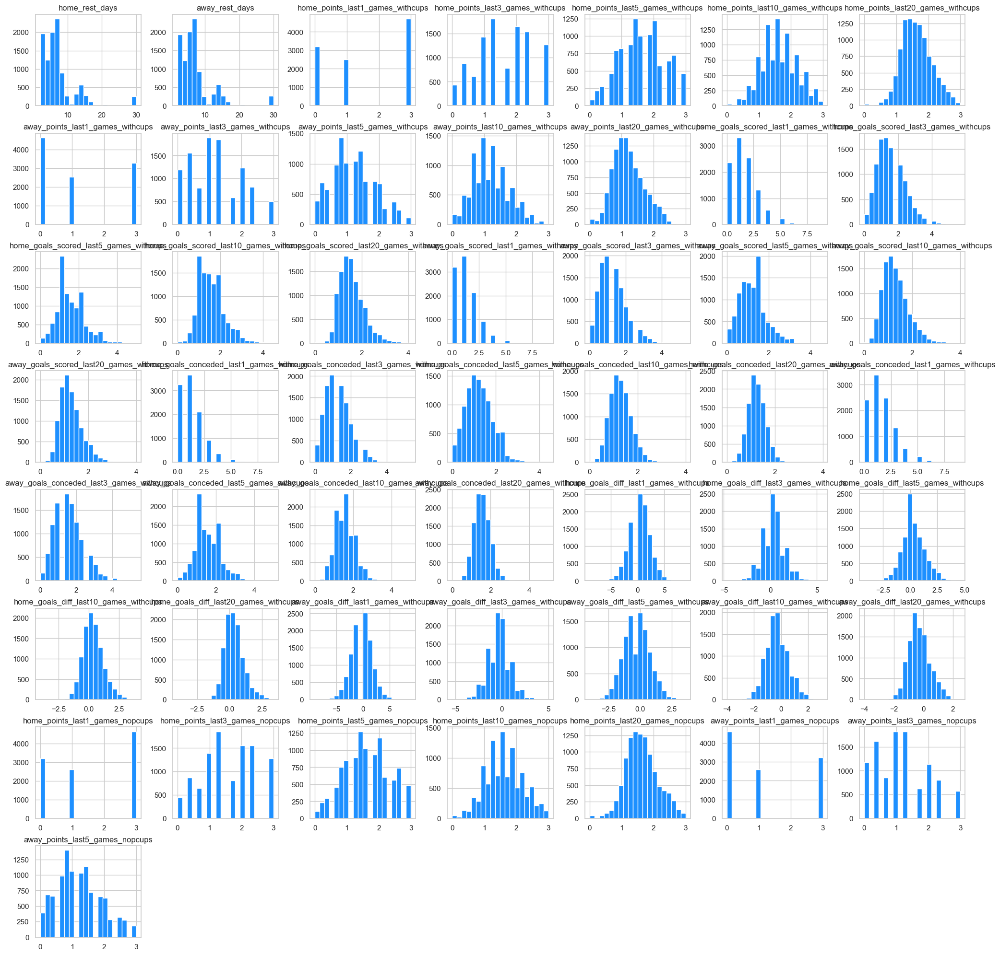

In [187]:
# Histograms of all numeric variables 
%matplotlib inline
form_df[numerical_cols[:50]].hist(bins=20, figsize=(25,25), color = 'dodgerblue')
plt.show()

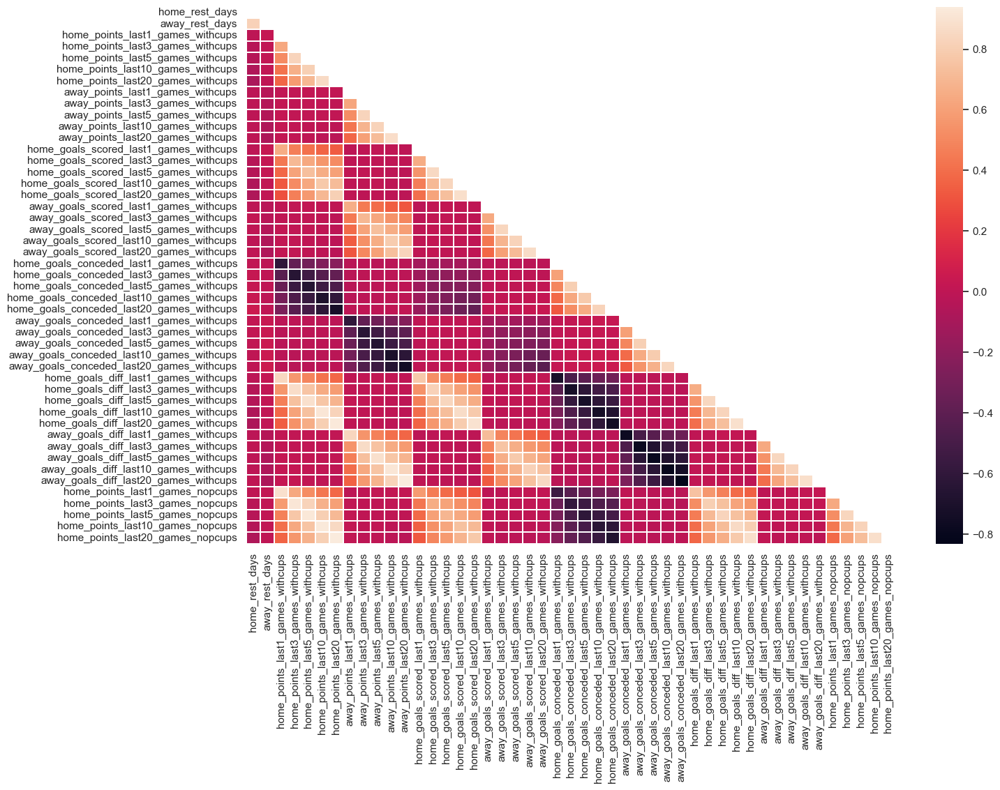

In [188]:
# Correlation Heatmap
corrmat = form_df.iloc[:, :50].corr()
top_corr_features = corrmat.index
matrix = np.triu(corrmat)
plt.figure(figsize=(15,10))
g = sns.heatmap(form_df[top_corr_features].corr(), mask=matrix ,linewidths=.15)

##### **Best Model**

In [189]:
# Split train and test sets
X = form_df.loc[:, 'league_id':]
y = form_df['result'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=14, stratify=y)
# Sets shape
print(f'X train shape: {X_train.shape}. Y train shape: {y_train.shape}\nX test shape: {X_test.shape}. Y test shape: {y_test.shape}')

# Pre-processing techniques
full_pipeline_mms = ColumnTransformer([
    ('num', MinMaxScaler(), numerical_cols), 
    ('cat_hot', OneHotEncoder(handle_unknown = 'ignore'), cat_cols)
], remainder='passthrough') # MinMax scaler + One-Hot encoding
X_tr_mms = full_pipeline_mms.fit_transform(X_train)
X_te_mms = full_pipeline_mms.transform(X_test)
print(f'X_tr_mms Shape: {X_tr_mms.shape}. X_te_mms Shape: {X_te_mms.shape}')

X train shape: (8872, 258). Y train shape: (8872,)
X test shape: (1566, 258). Y test shape: (1566,)
X_tr_mms Shape: (8872, 296). X_te_mms Shape: (1566, 296)


Test Accuracy:  0.545338441890166


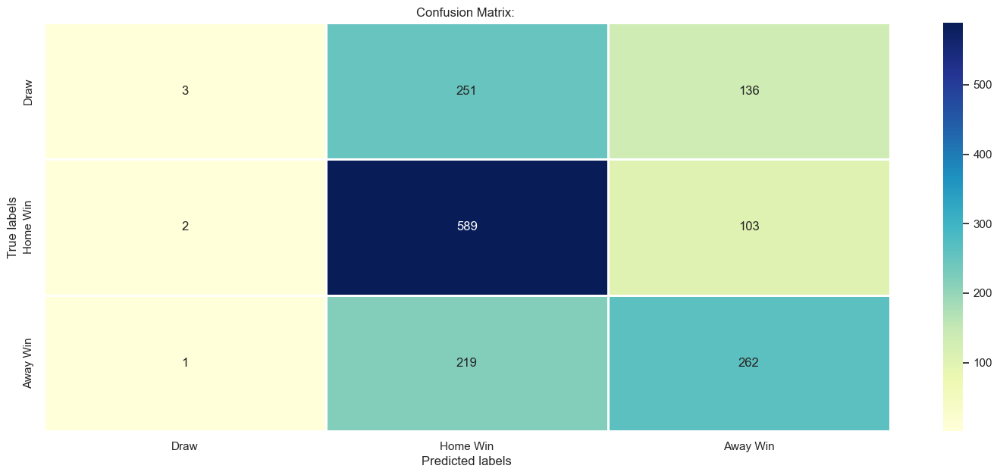

In [190]:
# Feature selection 
X_train_fs, X_test_fs, fs = select_features_rf(X_tr_mms, y_train, X_te_mms, 64)
# Model
top_model = KNeighborsClassifier(n_neighbors=191)
top_model.fit(X_train_fs, y_train)     
y_pred = top_model.predict(X_test_fs)
# Model's Accuracy and Confusion Matrix
print('Test Accuracy: ', metrics.accuracy_score(y_test, y_pred))
plot_confusion_matrix(y_pred, y_test, color_map='YlGnBu')

Feature Importance

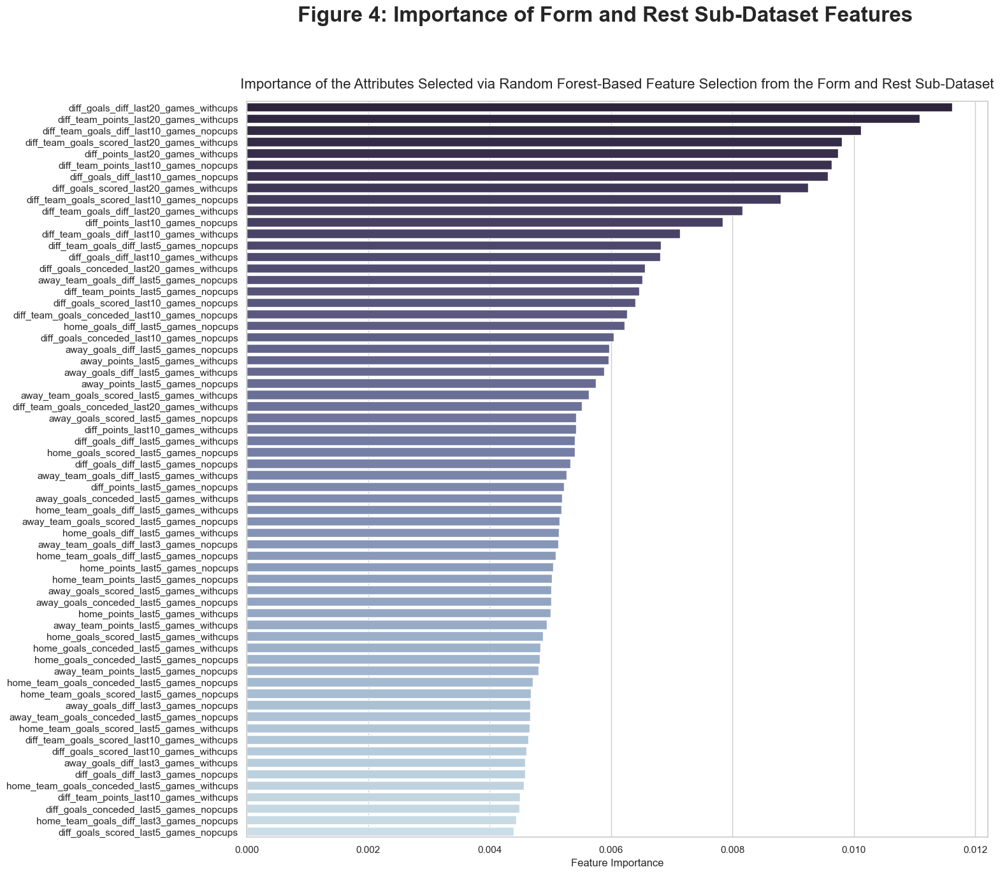

In [191]:
# Compute importance scores
clf = RandomForestClassifier(n_estimators=100, random_state=14)
clf.fit(X_tr_mms, y_train)
feature_names = np.array(X_train.columns.tolist())
sorted_indices = np.argsort(clf.feature_importances_)[::-1][:64]
top_64_feature_names = feature_names[sorted_indices]
df = pd.DataFrame({'Feature Names': top_64_feature_names, 'Feature Importance': clf.feature_importances_[sorted_indices]})

# Plot
plt.figure(figsize=(15,15), dpi=100)
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df['Feature Importance'], y=df['Feature Names'], orient='h', palette="ch:s=.25,rot=-.25_r")
ax.set(xlabel='Feature Importance', ylabel=None)
plt.suptitle('Figure 4: Importance of Form and Rest Sub-Dataset Features', weight='bold', fontsize=24)
ax.set_title('Importance of the Attributes Selected via Random Forest-Based Feature Selection from the Form and Rest Sub-Dataset',  fontsize=16, pad=15)
plt.show()

### **Stats Sub-Dataset**

##### *Data Import and Preparation*

In [192]:
# Import Data
stats_df = pd.read_csv('../../Data/Modeling_Final/4_stats.csv').set_index('id')
cat_cols = ['result', 'league_id', 'season_id', 'season_name_codes'] 
stats_df[cat_cols] = stats_df[cat_cols].astype(int).astype('category')
numerical_cols = stats_df.select_dtypes(np.number).columns.tolist()
stats_df.loc[:, numerical_cols] = stats_df.loc[:, numerical_cols].apply(pd.to_numeric, downcast='float')

print(stats_df.shape)
stats_df.head(2)

(10205, 724)


,result,league_id,season_id,home_shots_total_last1_games,home_shots_total_last3_games,home_shots_total_last5_games,home_shots_ongoal_last1_games,home_shots_ongoal_last3_games,home_shots_ongoal_last5_games,home_shots_offgoal_last1_games,home_shots_offgoal_last3_games,home_shots_offgoal_last5_games,home_shots_blocked_last1_games,home_shots_blocked_last3_games,home_shots_blocked_last5_games,home_shots_insidebox_last1_games,home_shots_insidebox_last3_games,home_shots_insidebox_last5_games,home_shots_outsidebox_last1_games,home_shots_outsidebox_last3_games,home_shots_outsidebox_last5_games,home_fouls_last1_games,home_fouls_last3_games,home_fouls_last5_games,home_corners_last1_games,home_corners_last3_games,home_corners_last5_games,home_offsides_last1_games,home_offsides_last3_games,home_offsides_last5_games,home_possessiontime_last1_games,home_possessiontime_last3_games,home_possessiontime_last5_games,home_yellowcards_last1_games,home_yellowcards_last3_games,home_yellowcards_last5_games,home_redcards_last1_games,home_redcards_last3_games,home_redcards_last5_games,home_yellowredcards_last1_games,home_yellowredcards_last3_games,home_yellowredcards_last5_games,home_saves_last1_games,home_saves_last3_games,home_saves_last5_games,home_tackles_last1_games,home_tackles_last3_games,home_tackles_last5_games,away_shots_total_last1_games,away_shots_total_last3_games,away_shots_total_last5_games,away_shots_ongoal_last1_games,away_shots_ongoal_last3_games,away_shots_ongoal_last5_games,away_shots_offgoal_last1_games,away_shots_offgoal_last3_games,away_shots_offgoal_last5_games,away_shots_blocked_last1_games,away_shots_blocked_last3_games,away_shots_blocked_last5_games,away_shots_insidebox_last1_games,away_shots_insidebox_last3_games,away_shots_insidebox_last5_games,away_shots_outsidebox_last1_games,away_shots_outsidebox_last3_games,away_shots_outsidebox_last5_games,away_fouls_last1_games,away_fouls_last3_games,away_fouls_last5_games,away_corners_last1_games,away_corners_last3_games,away_corners_last5_games,away_offsides_last1_games,away_offsides_last3_games,away_offsides_last5_games,away_possessiontime_last1_games,away_possessiontime_last3_games,away_possessiontime_last5_games,away_yellowcards_last1_games,away_yellowcards_last3_games,away_yellowcards_last5_games,away_redcards_last1_games,away_redcards_last3_games,away_redcards_last5_games,away_yellowredcards_last1_games,away_yellowredcards_last3_games,away_yellowredcards_last5_games,away_saves_last1_games,away_saves_last3_games,away_saves_last5_games,away_tackles_last1_games,away_tackles_last3_games,away_tackles_last5_games,home_passes_total_last1_games,home_passes_total_last3_games,home_passes_total_last5_games,home_passes_accurate_last1_games,home_passes_accurate_last3_games,home_passes_accurate_last5_games,home_passes_percentage_last1_games,home_passes_percentage_last3_games,home_passes_percentage_last5_games,away_passes_total_last1_games,away_passes_total_last3_games,away_passes_total_last5_games,away_passes_accurate_last1_games,away_passes_accurate_last3_games,away_passes_accurate_last5_games,away_passes_percentage_last1_games,away_passes_percentage_last3_games,away_passes_percentage_last5_games,home_attacks_attacks_last1_games,home_attacks_attacks_last3_games,home_attacks_attacks_last5_games,home_attacks_dangerous_attacks_last1_games,home_attacks_dangerous_attacks_last3_games,home_attacks_dangerous_attacks_last5_games,away_attacks_attacks_last1_games,away_attacks_attacks_last3_games,away_attacks_attacks_last5_games,away_attacks_dangerous_attacks_last1_games,away_attacks_dangerous_attacks_last3_games,away_attacks_dangerous_attacks_last5_games,home_diff_shots_total_last1_games,home_diff_shots_total_last3_games,home_diff_shots_total_last5_games,away_diff_shots_total_last1_games,away_diff_shots_total_last3_games,away_diff_shots_total_last5_games,home_diff_shots_ongoal_last1_games,home_diff_shots_ongoal_last3_games,home_diff_shots_ongoal_last5_games,away_diff_shots_ongoal_last1_games,away_diff_

##### *EDA*

In [193]:
print(stats_df.info(verbose=False))
round(stats_df.describe(), 2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10205 entries, 2344 to 18157344
Columns: 724 entries, result to season_name_codes
dtypes: category(4), float32(720)
memory usage: 28.1 MB
None


,home_shots_total_last1_games,home_shots_total_last3_games,home_shots_total_last5_games,home_shots_ongoal_last1_games,home_shots_ongoal_last3_games,home_shots_ongoal_last5_games,home_shots_offgoal_last1_games,home_shots_offgoal_last3_games,home_shots_offgoal_last5_games,home_shots_blocked_last1_games,home_shots_blocked_last3_games,home_shots_blocked_last5_games,home_shots_insidebox_last1_games,home_shots_insidebox_last3_games,home_shots_insidebox_last5_games,home_shots_outsidebox_last1_games,home_shots_outsidebox_last3_games,home_shots_outsidebox_last5_games,home_fouls_last1_games,home_fouls_last3_games,home_fouls_last5_games,home_corners_last1_games,home_corners_last3_games,home_corners_last5_games,home_offsides_last1_games,home_offsides_last3_games,home_offsides_last5_games,home_possessiontime_last1_games,home_possessiontime_last3_games,home_possessiontime_last5_games,home_yellowcards_last1_games,home_yellowcards_last3_games,home_yellowcards_last5_games,home_redcards_last1_games,home_redcards_last3_games,home_redcards_last5_games,home_yellowredcards_last1_games,home_yellowredcards_last3_games,home_yellowredcards_last5_games,home_saves_last1_games,home_saves_last3_games,home_saves_last5_games,home_tackles_last1_games,home_tackles_last3_games,home_tackles_last5_games,away_shots_total_last1_games,away_shots_total_last3_games,away_shots_total_last5_games,away_shots_ongoal_last1_games,away_shots_ongoal_last3_games,away_shots_ongoal_last5_games,away_shots_offgoal_last1_games,away_shots_offgoal_last3_games,away_shots_offgoal_last5_games,away_shots_blocked_last1_games,away_shots_blocked_last3_games,away_shots_blocked_last5_games,away_shots_insidebox_last1_games,away_shots_insidebox_last3_games,away_shots_insidebox_last5_games,away_shots_outsidebox_last1_games,away_shots_outsidebox_last3_games,away_shots_outsidebox_last5_games,away_fouls_last1_games,away_fouls_last3_games,away_fouls_last5_games,away_corners_last1_games,away_corners_last3_games,away_corners_last5_games,away_offsides_last1_games,away_offsides_last3_games,away_offsides_last5_games,away_possessiontime_last1_games,away_possessiontime_last3_games,away_possessiontime_last5_games,away_yellowcards_last1_games,away_yellowcards_last3_games,away_yellowcards_last5_games,away_redcards_last1_games,away_redcards_last3_games,away_redcards_last5_games,away_yellowredcards_last1_games,away_yellowredcards_last3_games,away_yellowredcards_last5_games,away_saves_last1_games,away_saves_last3_games,away_saves_last5_games,away_tackles_last1_games,away_tackles_last3_games,away_tackles_last5_games,home_passes_total_last1_games,home_passes_total_last3_games,home_passes_total_last5_games,home_passes_accurate_last1_games,home_passes_accurate_last3_games,home_passes_accurate_last5_games,home_passes_percentage_last1_games,home_passes_percentage_last3_games,home_passes_percentage_last5_games,away_passes_total_last1_games,away_passes_total_last3_games,away_passes_total_last5_games,away_passes_accurate_last1_games,away_passes_accurate_last3_games,away_passes_accurate_last5_games,away_passes_percentage_last1_games,away_passes_percentage_last3_games,away_passes_percentage_last5_games,home_attacks_attacks_last1_games,home_attacks_attacks_last3_games,home_attacks_attacks_last5_games,home_attacks_dangerous_attacks_last1_games,home_attacks_dangerous_attacks_last3_games,home_attacks_dangerous_attacks_last5_games,away_attacks_attacks_last1_games,away_attacks_attacks_last3_games,away_attacks_attacks_last5_games,away_attacks_dangerous_attacks_last1_games,away_attacks_dangerous_attacks_last3_games,away_attacks_dangerous_attacks_last5_games,home_diff_shots_total_last1_games,home_diff_shots_total_last3_games,home_diff_shots_total_last5_games,away_diff_shots_total_last1_games,away_diff_shots_total_last3_games,away_diff_shots_total_last5_games,home_diff_shots_ongoal_last1_games,home_diff_shots_ongoal_last3_games,home_diff_shots_ongoal_last5_games,away_diff_shots_ongoal_last1_games,away_diff_shots_ongoal_last3_games,aw

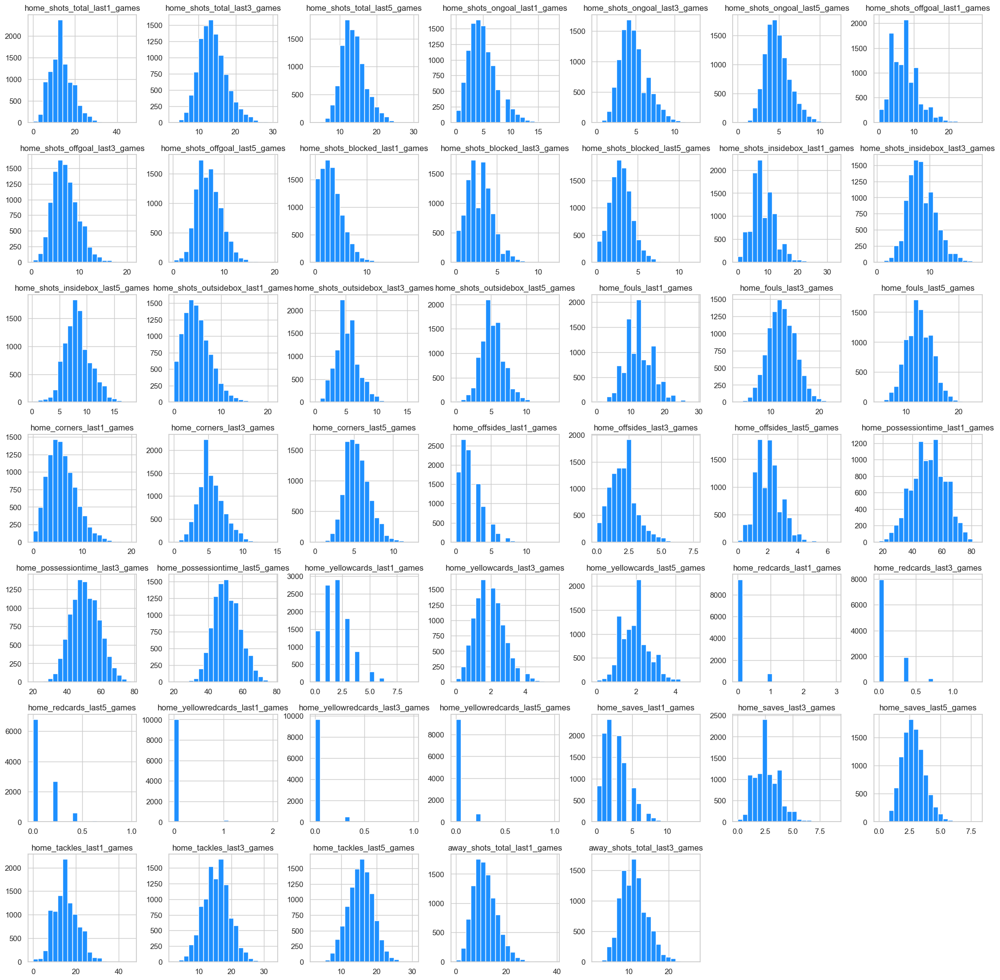

In [194]:
# Histograms of all numeric variables 
%matplotlib inline
stats_df[stats_df.columns[:50]].hist(bins=20, figsize=(25,25), color = 'dodgerblue')
plt.show() 

##### **Best Model**

In [195]:
# Split train and test sets
X = stats_df.loc[:, 'league_id':]
y = stats_df['result'] 
cat_cols.remove('result')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=14, stratify=y)
# Sets shape
print(f'X train shape: {X_train.shape}. Y train shape: {y_train.shape}\nX test shape: {X_test.shape}. Y test shape: {y_test.shape}')

# Pre-processing techniques
full_pipeline_ord = ColumnTransformer([
    ('num', StandardScaler(), numerical_cols),
    ('cat_ord', OrdinalEncoder(), cat_cols)], 
    remainder='passthrough') # Standard scaler + Ordinal encoding
X_tr_ord = full_pipeline_ord.fit_transform(X_train)
X_te_ord = full_pipeline_ord.transform(X_test)
print(f'X_tr_ord Shape: {X_tr_ord.shape}. X_te_ord Shape: {X_te_ord.shape}')

X train shape: (8674, 723). Y train shape: (8674,)
X test shape: (1531, 723). Y test shape: (1531,)
X_tr_ord Shape: (8674, 723). X_te_ord Shape: (1531, 723)


Test Accuracy:  0.527106466361855


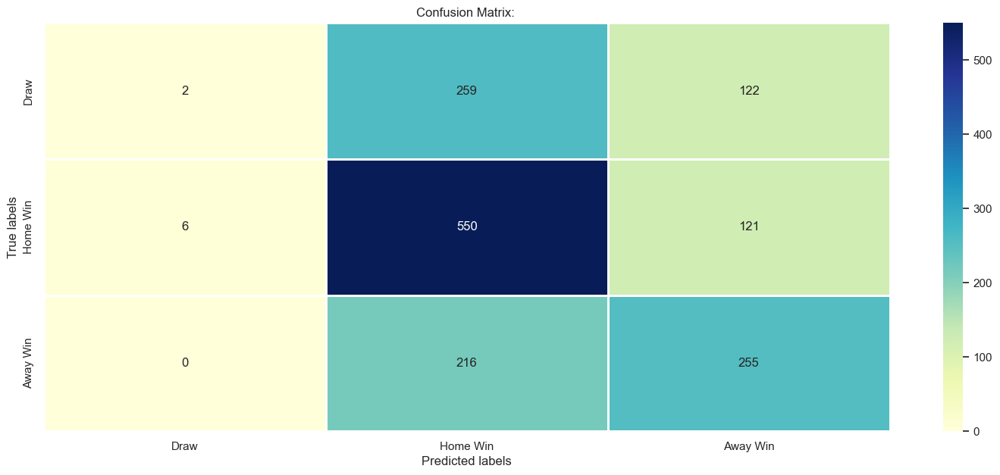

In [196]:
# Feature selection
X_train_fs, X_test_fs, fs = select_features_f(X_tr_ord, y_train, X_te_ord, 88)
# Model
top_model = LogisticRegression(C=0.01, max_iter=10000, solver='saga', multi_class='multinomial')
top_model.fit(X_train_fs, y_train)           
y_pred = top_model.predict(X_test_fs)
# Model's Accuracy and Confusion Matrix
print('Test Accuracy: ', metrics.accuracy_score(y_test, y_pred))
plot_confusion_matrix(y_pred, y_test, color_map='YlGnBu')

Feature Importance

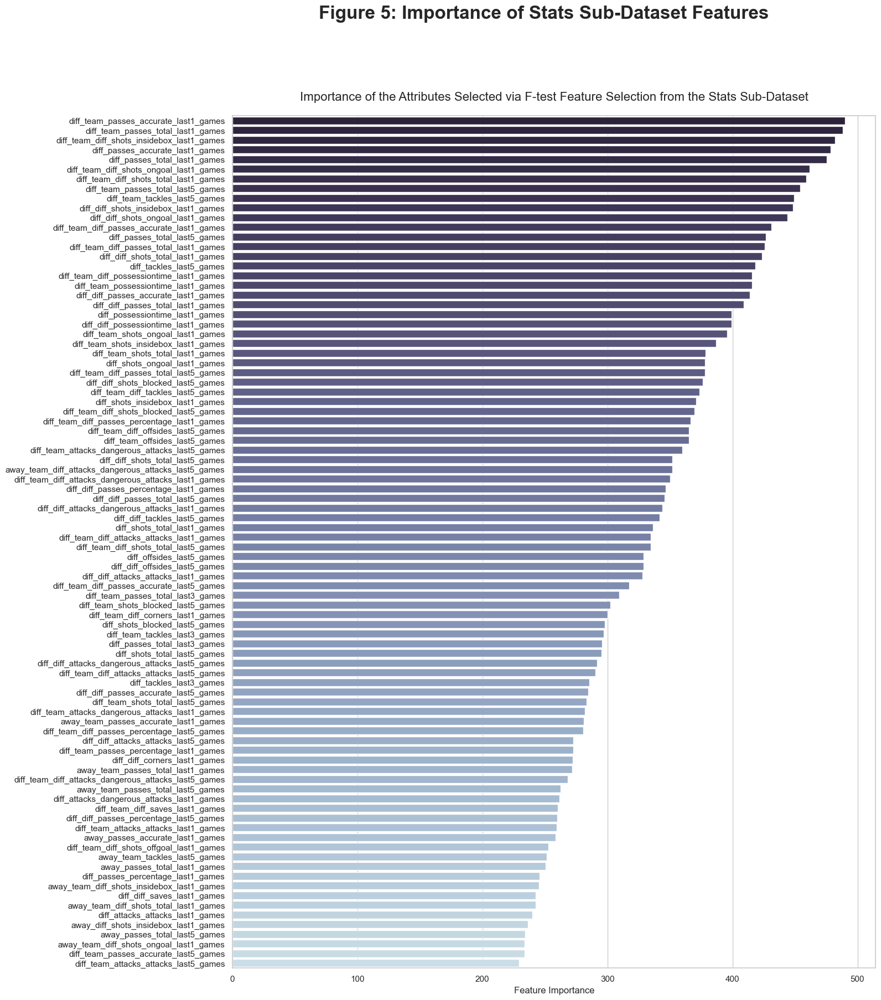

In [197]:
# Compute importance scores
f = f_classif(X_tr_ord, y_train)[0]
feature_names = np.array(X_train.columns.tolist())
sorted_indices = np.argsort(f)[::-1][:88]
top_88_feature_names = feature_names[sorted_indices]
sorted_indices
df = pd.DataFrame({'Feature Names': top_88_feature_names, 'Feature Importance': f[sorted_indices]})

# Plot
plt.figure(figsize=(15,20), dpi=100)
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df['Feature Importance'], y=df['Feature Names'], orient='h', palette="ch:s=.25,rot=-.25_r")
ax.set(xlabel='Feature Importance', ylabel=None)
plt.suptitle('Figure 5: Importance of Stats Sub-Dataset Features', weight='bold', fontsize=24)
ax.set_title('Importance of the Attributes Selected via F-test Feature Selection from the Stats Sub-Dataset',  fontsize=16, pad=20)
plt.show()

### **Odds Sub-Dataset**

##### *Data Import and Preparation*

In [198]:
# Import Data
odds_df = pd.read_csv('../../Data/Modeling_Final/5_odds.csv').set_index('id')
# Data types
cat_cols = ['result', 'league_id', 'season_id', 'season_name_codes'] 
odds_df[cat_cols] = odds_df[cat_cols].astype(int).astype('category')
cat_cols.remove('result')
numerical_cols = odds_df.select_dtypes(np.number).columns.tolist()
odds_df.loc[:, numerical_cols] = odds_df.loc[:, numerical_cols].apply(pd.to_numeric, downcast='float')

print(odds_df.shape)
odds_df.head(2)

(8415, 780)


,result,league_id,season_id,DoubleChance__1X_mean,DoubleChance__1X_median,DoubleChance__1X_std,DoubleChance__1X_var,DoubleChance__1X_max,DoubleChance__1X_min,DoubleChance__1X_1st_quart,DoubleChance__1X_3rd_quart,DoubleChance__1X_range,DoubleChance__1X_IQR,DoubleChance__12_mean,DoubleChance__12_median,DoubleChance__12_std,DoubleChance__12_var,DoubleChance__12_max,DoubleChance__12_min,DoubleChance__12_1st_quart,DoubleChance__12_3rd_quart,DoubleChance__12_range,DoubleChance__12_IQR,DoubleChance__X2_mean,DoubleChance__X2_median,DoubleChance__X2_std,DoubleChance__X2_var,DoubleChance__X2_max,DoubleChance__X2_min,DoubleChance__X2_1st_quart,DoubleChance__X2_3rd_quart,DoubleChance__X2_range,DoubleChance__X2_IQR,ExactGoalsNumber__0_mean,ExactGoalsNumber__0_median,ExactGoalsNumber__0_max,ExactGoalsNumber__0_min,ExactGoalsNumber__0_1st_quart,ExactGoalsNumber__0_3rd_quart,ExactGoalsNumber__0_range,ExactGoalsNumber__0_IQR,ExactGoalsNumber__1_mean,ExactGoalsNumber__1_median,ExactGoalsNumber__1_max,ExactGoalsNumber__1_min,ExactGoalsNumber__1_1st_quart,ExactGoalsNumber__1_3rd_quart,ExactGoalsNumber__1_range,ExactGoalsNumber__1_IQR,ExactGoalsNumber__2_mean,ExactGoalsNumber__2_median,ExactGoalsNumber__2_max,ExactGoalsNumber__2_min,ExactGoalsNumber__2_1st_quart,ExactGoalsNumber__2_3rd_quart,ExactGoalsNumber__2_range,ExactGoalsNumber__2_IQR,ExactGoalsNumber__3_mean,ExactGoalsNumber__3_median,ExactGoalsNumber__3_max,ExactGoalsNumber__3_min,ExactGoalsNumber__3_1st_quart,ExactGoalsNumber__3_3rd_quart,ExactGoalsNumber__3_range,ExactGoalsNumber__3_IQR,ExactGoalsNumber__4_mean,ExactGoalsNumber__4_median,ExactGoalsNumber__4_max,ExactGoalsNumber__4_min,ExactGoalsNumber__4_1st_quart,ExactGoalsNumber__4_3rd_quart,ExactGoalsNumber__4_range,ExactGoalsNumber__4_IQR,ExactGoalsNumber__5_mean,ExactGoalsNumber__5_median,ExactGoalsNumber__5_max,ExactGoalsNumber__5_min,ExactGoalsNumber__5_1st_quart,ExactGoalsNumber__5_3rd_quart,ExactGoalsNumber__5_range,ExactGoalsNumber__5_IQR,ExactGoalsNumber__6_mean,ExactGoalsNumber__6_median,ExactGoalsNumber__6_max,ExactGoalsNumber__6_min,ExactGoalsNumber__6_1st_quart,ExactGoalsNumber__6_3rd_quart,ExactGoalsNumber__6_range,ExactGoalsNumber__6_IQR,ExactGoalsNumber__7_mean,ExactGoalsNumber__7_median,ExactGoalsNumber__7_max,ExactGoalsNumber__7_min,ExactGoalsNumber__7_1st_quart,ExactGoalsNumber__7_3rd_quart,ExactGoalsNumber__7_range,ExactGoalsNumber__7_IQR,3W__1_mean,3W__1_median,3W__1_std,3W__1_var,3W__1_max,3W__1_min,3W__1_1st_quart,3W__1_3rd_quart,3W__1_range,3W__1_IQR,3W__X_mean,3W__X_median,3W__X_std,3W__X_var,3W__X_max,3W__X_min,3W__X_1st_quart,3W__X_3rd_quart,3W__X_range,3W__X_IQR,3W__2_mean,3W__2_median,3W__2_std,3W__2_var,3W__2_max,3W__2_min,3W__2_1st_quart,3W__2_3rd_quart,3W__2_range,3W__2_IQR,3W1stHalf__1_mean,3W1stHalf__1_median,3W1stHalf__1_std,3W1stHalf__1_var,3W1stHalf__1_max,3W1stHalf__1_min,3W1stHalf__1_1st_quart,3W1stHalf__1_3rd_quart,3W1stHalf__1_range,3W1stHalf__1_IQR,3W1stHalf__X_mean,3W1stHalf__X_median,3W1stHalf__X_std,3W1stHalf__X_var,3W1stHalf__X_max,3W1stHalf__X_min,3W1stHalf__X_1st_quart,3W1stHalf__X_3rd_quart,3W1stHalf__X_range,3W1stHalf__X_IQR,3W1stHalf__2_mean,3W1stHalf__2_median,3W1stHalf__2_std,3W1stHalf__2_var,3W1stHalf__2_max,3W1stHalf__2_min,3W1stHalf__2_1st_quart,3W1stHalf__2_3rd_quart,3W1stHalf__2_range,3W1stHalf__2_IQR,3W2ndHalf__1_mean,3W2ndHalf__1_median,3W2ndHalf__1_std,3W2ndHalf__1_var,3W2ndHalf__1_max,3W2ndHalf__1_min,3W2ndHalf__1_1st_quart,3W2ndHalf__1_3rd_quart,3W2ndHalf__1_range,3W2ndHalf__1_IQR,3W2ndHalf__X_mean,3W2ndHalf__X_median,3W2ndHalf__X_std,3W2ndHalf__X_var,3W2ndHalf__X_max,3W2ndHalf__X_min,3W2ndHalf__X_1st_quart,3W2ndHalf__X_3rd_quart,3W2ndHalf__X_range,3W2ndHalf__X_IQR,3W2ndHalf__2_mean,3W2ndHalf__2_median,3W2ndHalf__2_std,3W2ndHalf__2_var,3W2ndHalf__2_max,3W2ndHalf__2_min,3W2ndHalf__2_1st_quart,3W2ndHalf__2_3rd_quart,3W2ndHalf__2_range,3W2ndHalf__2_IQR,O/U__Over_mean,O/U__Over_median,O/U__Over_std,O/U__Over_var,O/U__Over_max,O/U__Over_min,O/U__Over_1st_quart,O/U__Over_3rd_quar

##### *EDA*

In [199]:
print(odds_df.info(verbose=False))
round(odds_df.describe(), 2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8415 entries, 1710802 to 18220188
Columns: 780 entries, result to season_name_codes
dtypes: category(4), float32(776)
memory usage: 25.0 MB
None


,DoubleChance__1X_mean,DoubleChance__1X_median,DoubleChance__1X_std,DoubleChance__1X_var,DoubleChance__1X_max,DoubleChance__1X_min,DoubleChance__1X_1st_quart,DoubleChance__1X_3rd_quart,DoubleChance__1X_range,DoubleChance__1X_IQR,DoubleChance__12_mean,DoubleChance__12_median,DoubleChance__12_std,DoubleChance__12_var,DoubleChance__12_max,DoubleChance__12_min,DoubleChance__12_1st_quart,DoubleChance__12_3rd_quart,DoubleChance__12_range,DoubleChance__12_IQR,DoubleChance__X2_mean,DoubleChance__X2_median,DoubleChance__X2_std,DoubleChance__X2_var,DoubleChance__X2_max,DoubleChance__X2_min,DoubleChance__X2_1st_quart,DoubleChance__X2_3rd_quart,DoubleChance__X2_range,DoubleChance__X2_IQR,ExactGoalsNumber__0_mean,ExactGoalsNumber__0_median,ExactGoalsNumber__0_max,ExactGoalsNumber__0_min,ExactGoalsNumber__0_1st_quart,ExactGoalsNumber__0_3rd_quart,ExactGoalsNumber__0_range,ExactGoalsNumber__0_IQR,ExactGoalsNumber__1_mean,ExactGoalsNumber__1_median,ExactGoalsNumber__1_max,ExactGoalsNumber__1_min,ExactGoalsNumber__1_1st_quart,ExactGoalsNumber__1_3rd_quart,ExactGoalsNumber__1_range,ExactGoalsNumber__1_IQR,ExactGoalsNumber__2_mean,ExactGoalsNumber__2_median,ExactGoalsNumber__2_max,ExactGoalsNumber__2_min,ExactGoalsNumber__2_1st_quart,ExactGoalsNumber__2_3rd_quart,ExactGoalsNumber__2_range,ExactGoalsNumber__2_IQR,ExactGoalsNumber__3_mean,ExactGoalsNumber__3_median,ExactGoalsNumber__3_max,ExactGoalsNumber__3_min,ExactGoalsNumber__3_1st_quart,ExactGoalsNumber__3_3rd_quart,ExactGoalsNumber__3_range,ExactGoalsNumber__3_IQR,ExactGoalsNumber__4_mean,ExactGoalsNumber__4_median,ExactGoalsNumber__4_max,ExactGoalsNumber__4_min,ExactGoalsNumber__4_1st_quart,ExactGoalsNumber__4_3rd_quart,ExactGoalsNumber__4_range,ExactGoalsNumber__4_IQR,ExactGoalsNumber__5_mean,ExactGoalsNumber__5_median,ExactGoalsNumber__5_max,ExactGoalsNumber__5_min,ExactGoalsNumber__5_1st_quart,ExactGoalsNumber__5_3rd_quart,ExactGoalsNumber__5_range,ExactGoalsNumber__5_IQR,ExactGoalsNumber__6_mean,ExactGoalsNumber__6_median,ExactGoalsNumber__6_max,ExactGoalsNumber__6_min,ExactGoalsNumber__6_1st_quart,ExactGoalsNumber__6_3rd_quart,ExactGoalsNumber__6_range,ExactGoalsNumber__6_IQR,ExactGoalsNumber__7_mean,ExactGoalsNumber__7_median,ExactGoalsNumber__7_max,ExactGoalsNumber__7_min,ExactGoalsNumber__7_1st_quart,ExactGoalsNumber__7_3rd_quart,ExactGoalsNumber__7_range,ExactGoalsNumber__7_IQR,3W__1_mean,3W__1_median,3W__1_std,3W__1_var,3W__1_max,3W__1_min,3W__1_1st_quart,3W__1_3rd_quart,3W__1_range,3W__1_IQR,3W__X_mean,3W__X_median,3W__X_std,3W__X_var,3W__X_max,3W__X_min,3W__X_1st_quart,3W__X_3rd_quart,3W__X_range,3W__X_IQR,3W__2_mean,3W__2_median,3W__2_std,3W__2_var,3W__2_max,3W__2_min,3W__2_1st_quart,3W__2_3rd_quart,3W__2_range,3W__2_IQR,3W1stHalf__1_mean,3W1stHalf__1_median,3W1stHalf__1_std,3W1stHalf__1_var,3W1stHalf__1_max,3W1stHalf__1_min,3W1stHalf__1_1st_quart,3W1stHalf__1_3rd_quart,3W1stHalf__1_range,3W1stHalf__1_IQR,3W1stHalf__X_mean,3W1stHalf__X_median,3W1stHalf__X_std,3W1stHalf__X_var,3W1stHalf__X_max,3W1stHalf__X_min,3W1stHalf__X_1st_quart,3W1stHalf__X_3rd_quart,3W1stHalf__X_range,3W1stHalf__X_IQR,3W1stHalf__2_mean,3W1stHalf__2_median,3W1stHalf__2_std,3W1stHalf__2_var,3W1stHalf__2_max,3W1stHalf__2_min,3W1stHalf__2_1st_quart,3W1stHalf__2_3rd_quart,3W1stHalf__2_range,3W1stHalf__2_IQR,3W2ndHalf__1_mean,3W2ndHalf__1_median,3W2ndHalf__1_std,3W2ndHalf__1_var,3W2ndHalf__1_max,3W2ndHalf__1_min,3W2ndHalf__1_1st_quart,3W2ndHalf__1_3rd_quart,3W2ndHalf__1_range,3W2ndHalf__1_IQR,3W2ndHalf__X_mean,3W2ndHalf__X_median,3W2ndHalf__X_std,3W2ndHalf__X_var,3W2ndHalf__X_max,3W2ndHalf__X_min,3W2ndHalf__X_1st_quart,3W2ndHalf__X_3rd_quart,3W2ndHalf__X_range,3W2ndHalf__X_IQR,3W2ndHalf__2_mean,3W2ndHalf__2_median,3W2ndHalf__2_std,3W2ndHalf__2_var,3W2ndHalf__2_max,3W2ndHalf__2_min,3W2ndHalf__2_1st_quart,3W2ndHalf__2_3rd_quart,3W2ndHalf__2_range,3W2ndHalf__2_IQR,O/U__Over_mean,O/U__Over_median,O/U__Over_std,O/U__Over_var,O/U__Over_max,O/U__Over_min,O/U__Over_1st_quart,O/U__Over_3rd_quart,O/U__Over_range,O/U__Over

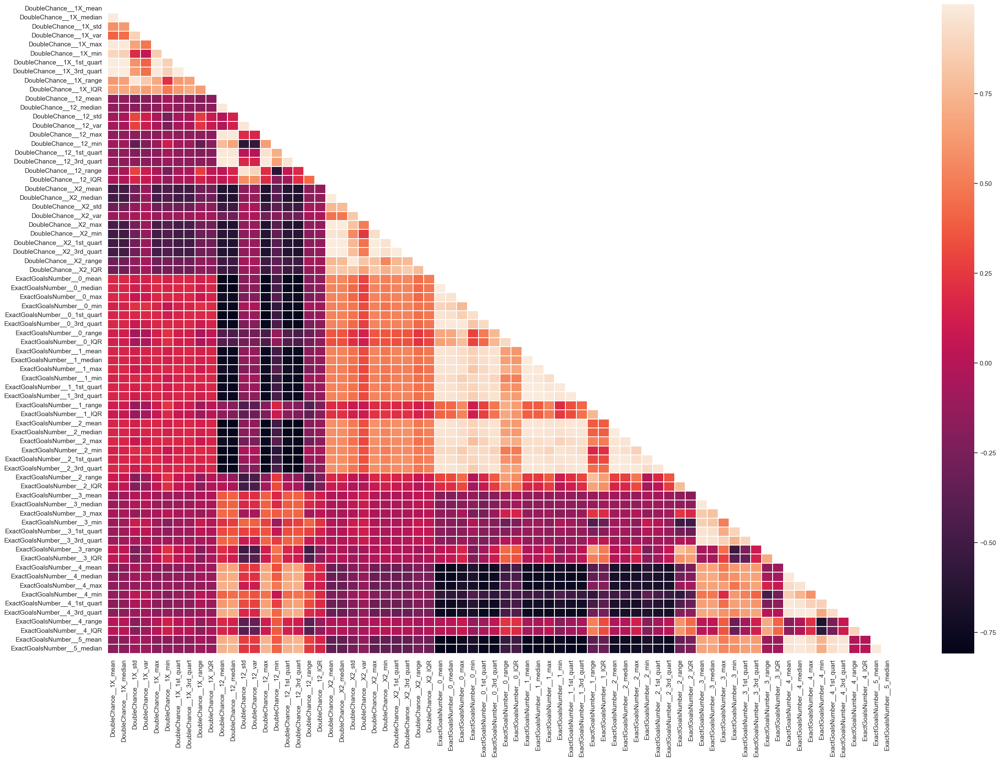

In [200]:
# Correlation Heatmap
corrmat = odds_df.iloc[:, :75].corr()
top_corr_features = corrmat.index
matrix = np.triu(corrmat)
plt.figure(figsize=(30,20))
g=sns.heatmap(odds_df[top_corr_features].corr(), mask=matrix ,linewidths=.15)

##### **Best Model**

In [201]:
# Split train and test sets
X = odds_df.loc[:, 'league_id':]
y = odds_df['result'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=14, stratify=y)
# Sets shape
print(f'X train shape: {X_train.shape}. Y train shape: {y_train.shape}\nX test shape: {X_test.shape}. Y test shape: {y_test.shape}')

# Pre-processing techniques
full_pipeline_mms = ColumnTransformer([
    ('num', MinMaxScaler(), numerical_cols), 
    ('cat_hot', OneHotEncoder(handle_unknown = 'ignore'), cat_cols)
], remainder='passthrough') # Standard scaler + One-Hot encoding
X_tr_mms = full_pipeline_mms.fit_transform(X_train)
X_te_mms = full_pipeline_mms.transform(X_test)
print(f'X_tr_mms Shape: {X_tr_mms.shape}. X_te_mms Shape: {X_te_mms.shape}')

X train shape: (7152, 779). Y train shape: (7152,)
X test shape: (1263, 779). Y test shape: (1263,)
X_tr_mms Shape: (7152, 811). X_te_mms Shape: (1263, 811)


Test Accuracy:  0.6009501187648456


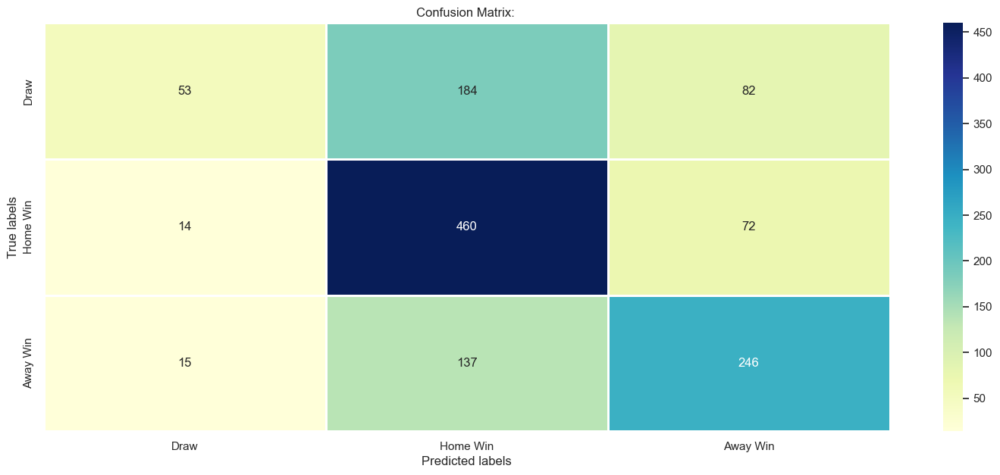

In [202]:
# Feature selection
X_train_fs, X_test_fs, fs = select_features_rf(X_tr_mms, y_train, X_te_mms, 16)
# Model
top_model = KNeighborsClassifier(n_neighbors=199)
top_model.fit(X_train_fs, y_train)           
y_pred = top_model.predict(X_test_fs)
# Model's Accuracy and Confusion Matrix
print('Test Accuracy: ', metrics.accuracy_score(y_test, y_pred))
plot_confusion_matrix(y_pred, y_test, color_map='YlGnBu')

Feature Importance

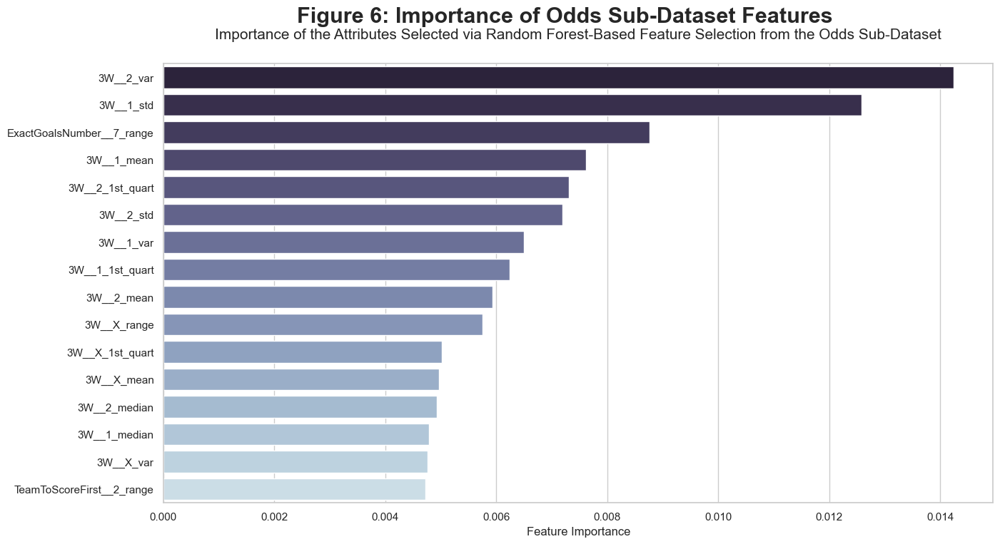

In [203]:
# Compute importance scores 
clf = RandomForestClassifier(n_estimators=100, random_state=14)
clf.fit(X_tr_mms, y_train)
feature_names = np.array(X_train.columns.tolist())[1:]
arr_imp = clf.feature_importances_[1:]
sorted_indices = np.argsort(arr_imp)[::-1][:16]
top_16_feature_names = feature_names[sorted_indices]
df = pd.DataFrame({'Feature Names': top_16_feature_names, 'Feature Importance': arr_imp[sorted_indices]})

# Plot
plt.figure(figsize=(15,8), dpi=100)
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df['Feature Importance'], y=df['Feature Names'], orient='h', palette="ch:s=.25,rot=-.25_r")
ax.set(xlabel='Feature Importance', ylabel=None)
plt.suptitle('Figure 6: Importance of Odds Sub-Dataset Features', weight='bold', fontsize=22)
ax.set_title('Importance of the Attributes Selected via Random Forest-Based Feature Selection from the Odds Sub-Dataset',  fontsize=15, pad=25)
plt.show()

### **Team Attributes Sub-Dataset**

##### *Data Import and Preparation*

In [204]:
# Import Data
team_attr = pd.read_csv('../../Data/Modeling_Final/6_team_attr.csv').set_index('id')

# Category data type
categorial_columns =  team_attr.loc[:, :'formations_away_formation'].columns.tolist() + team_attr.filter(regex='_is_major$').columns.tolist() + team_attr.filter(regex='^isrival_').columns.tolist()
team_attr[categorial_columns] = team_attr[categorial_columns].astype('category')
# Downcast numerical variables
float_cols = team_attr.select_dtypes(np.floating).columns.tolist()
int_cols = team_attr.select_dtypes(np.integer).columns.tolist()
team_attr.loc[:, float_cols] = team_attr.loc[:, float_cols].apply(pd.to_numeric, downcast='float')
team_attr.loc[:, int_cols] = team_attr.loc[:, int_cols].apply(pd.to_numeric, downcast='integer')

numerical_cols = float_cols + int_cols
cat_hot_one = ['league_id', 'formations_home_formation','formations_away_formation']

##### *EDA*

In [205]:
print(team_attr.info(verbose=False))
round(team_attr.describe(), 2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10536 entries, 251728 to 18157344
Columns: 32 entries, result to season_name_codes
dtypes: category(9), float32(4), int16(3), int8(16)
memory usage: 569.4 KB
None


,home_founded,away_founded,home_Attack,home_Midfield,home_Defence,home_TransferBudget,home_Width,away_Attack,away_Midfield,away_Defence,away_TransferBudget,away_Width,home_coach_age,away_coach_age,diff_Attack,diff_Midfield,diff_Defence,diff_TransferBudget,ratio_TransferBudget,diff_Width,diff_coach_age,diff_founded,season_name_codes
count,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.0,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00
mean,63.58,63.58,77.63,76.77,76.12,318.48,5.64,77.61,76.77,76.12,318.77,5.64,50.29,50.30,0.01,-0.00,0.0,-0.29,2.61,0.00,-0.01,0.00,2.42
std,24.90,24.89,4.43,3.78,3.66,378.36,1.15,4.45,3.79,3.68,378.95,1.15,7.55,7.54,6.04,5.07,5.0,498.28,6.23,1.53,10.43,30.93,1.68
min,0.00,0.00,64.00,66.00,65.00,5.00,2.00,64.00,63.00,65.00,5.00,2.00,29.00,29.00,-22.00,-15.00,-17.0,-1871.00,0.01,-5.00,-36.00,-161.00,0.00
25%,50.00,50.00,75.00,74.00,74.00,75.00,5.00,75.00,74.00,74.00,75.00,5.00,45.00,45.00,-4.00,-3.00,-3.0,-150.00,0.44,-1.00,-7.00,-15.00,1.00
50%,57.00,57.00,77.00,76.00,76.00,155.00,6.00,77.00,76.00,76.00,155.00,6.00,50.00,50.00,0.00,0.00,0.0,0.00,1.00,0.00,0.00,0.00,2.00
75%,75.00,75.00,80.00,79.00,78.00,410.00,6.00,80.00,79.00,78.00,410.00,6.00,55.00,55.00,4.00,3.00,3.0,150.00,2.29,1.00,7.00,15.00,4.00
max,163.00,163.00,93.00,89.00,87.00,1910.00,8.00,92.00,89.00,87.00,1910.00,8.00,74.00,74.00,23.00,17.00,17.0,1871.00,200.00,5.00,42.00,161.00,5.00


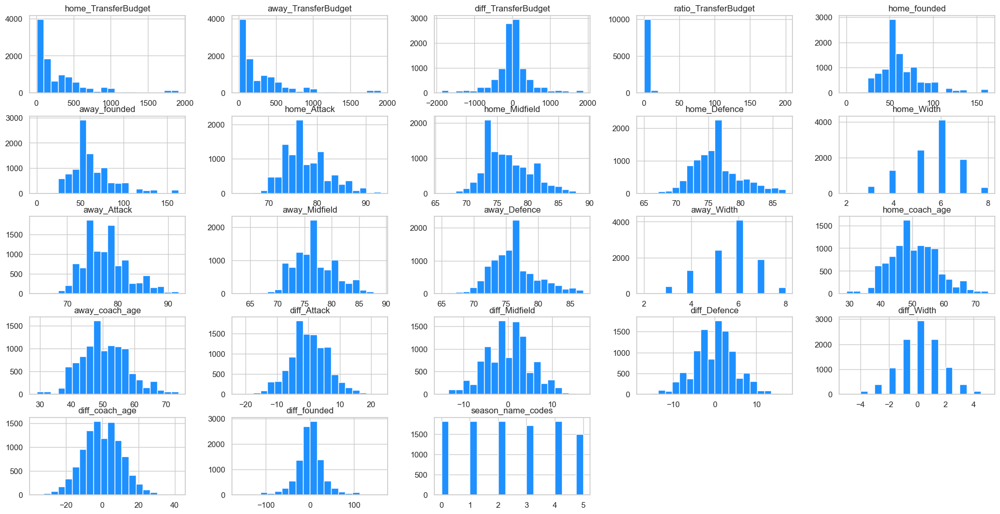

In [206]:
%matplotlib inline
team_attr[numerical_cols].hist(bins=20, figsize=(24,12), color = 'dodgerblue')
plt.show()

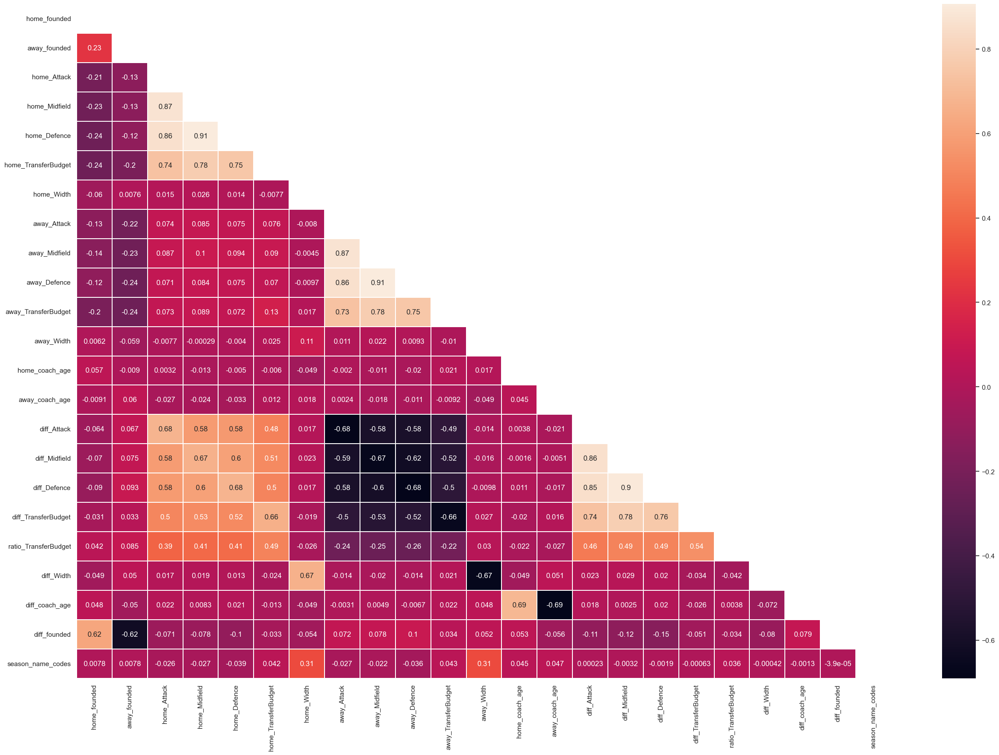

In [207]:
# Correlation Heatmap
corrmat = team_attr.corr()
top_corr_features = corrmat.index
matrix = np.triu(corrmat)
plt.figure(figsize=(30,20))
g=sns.heatmap(team_attr[top_corr_features].corr(), mask=matrix ,linewidths=.15, annot=True)

In [208]:
attributes = [['home_Attack', 'away_Attack'], ['home_Midfield', 'away_Midfield'], ['home_Defence', 'away_Defence'], ['home_TransferBudget', 'away_TransferBudget'], ['home_Width', 'away_Width'],['home_coach_age', 'away_coach_age']]
colors = [['#8106ba', '#f412e6'], ['#d00202', '#ff6633'], ['#000080', '#1e90ff'], ['#048916', '#57f40e'], ['#a04000', '#e59866'], ['#aeb6bf', '#283747']]
yaxes_titles = ['<b>Attack</b>', '<b>Midfield</b>', '<b>Defence</b>', '<b>Transfer Budget</b>', '<b>Width</b>', '<b>Coach Age</b>']

# Create subplots grid
fig = make_subplots(rows=6, cols=1, specs=[[{"secondary_y": True}], [{"secondary_y": True}], [{"secondary_y": True}], [{"secondary_y": True}], [{"secondary_y": True}], [{"secondary_y": True}]])
# Add traces and update y-axes title
for ind, i in enumerate(attributes):
    fig.add_trace(go.Box(x=team_attr['result'], y=team_attr[i[0]], name=i[0], marker_color=colors[ind][0],offsetgroup='a'),secondary_y=False, row=ind+1, col=1)
    fig.add_trace(go.Box(x=team_attr['result'], y=team_attr[i[1]], name=i[1],marker_color=colors[ind][1], offsetgroup='B'),secondary_y=True, row=ind+1, col=1)
    fig.update_yaxes(title_text=yaxes_titles[ind], row=ind+1, col=1)
# Update layout and x-axes title
fig.update_layout(boxmode='group', title_text="<b>FIFA Team attributes - home vs away</b>", width=1300, height=1200)
fig.update_xaxes(title_text="Results")
fig.show() 

##### **Best Model**

In [209]:
# Split train and test sets
X = team_attr.loc[:, 'league_id':]
y = team_attr['result'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=14, stratify=y)
# Sets shape
print('X train shape: ', X_train.shape, '. Y train shape: ',y_train.shape, '\nX test shape: ', X_test.shape, '. Y test shape: ', y_test.shape)

# Pre-processing techniques
full_pipeline_std = ColumnTransformer([
    ('num', StandardScaler(), numerical_cols), 
    ('cat_hot', OneHotEncoder(handle_unknown = 'ignore'), cat_hot_one)
], remainder='passthrough') # Standard scaler + One-Hot encoding
X_tr_std = full_pipeline_std.fit_transform(X_train)
X_te_std = full_pipeline_std.transform(X_test)
print(f'X_tr_std Shape: {X_tr_std.shape}. X_te_std Shape: {X_te_std.shape}')

X train shape:  (8955, 31) . Y train shape:  (8955,) 
X test shape:  (1581, 31) . Y test shape:  (1581,)
X_tr_std Shape: (8955, 75). X_te_std Shape: (1581, 75)


Test Accuracy:  0.5414294750158127


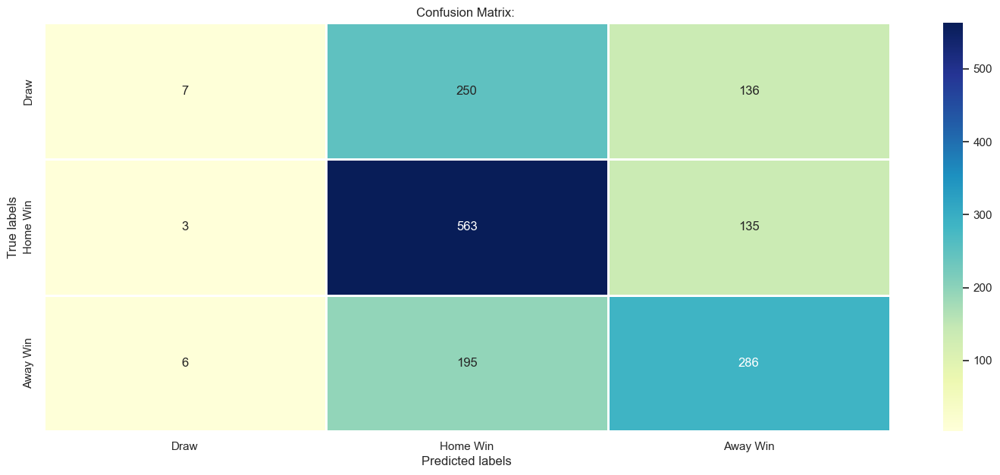

In [210]:
# Feature selection 
X_train_fs, X_test_fs, fs = select_features_f(X_tr_std, y_train, X_te_std, 15)
# Model
best_model = KNeighborsClassifier(n_neighbors=191)    
best_model.fit(X_train_fs, y_train)     
y_pred = best_model.predict(X_test_fs)
# Model's Accuracy and Confusion Matrix
print('Test Accuracy: ', metrics.accuracy_score(y_test, y_pred))
plot_confusion_matrix(y_pred, y_test, color_map='YlGnBu')

Feature Importance

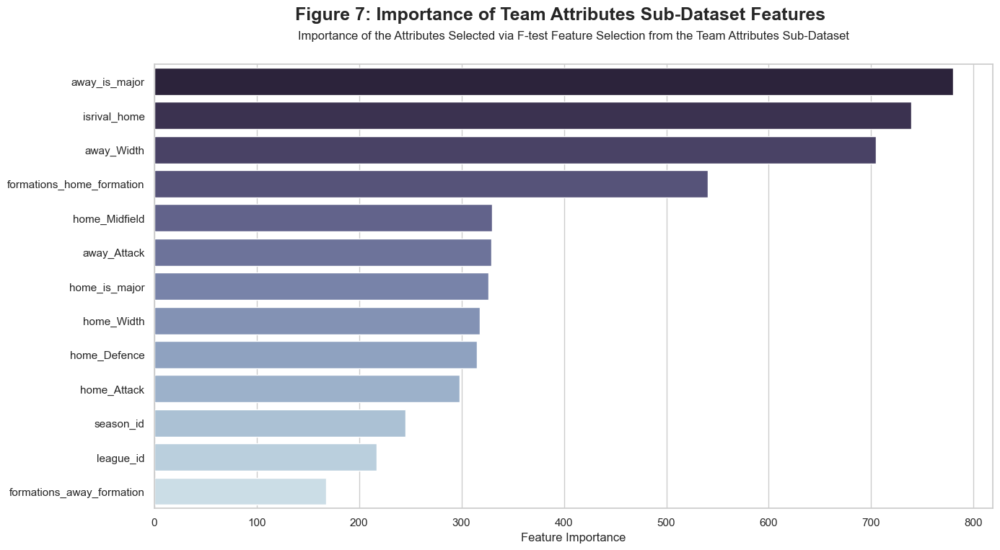

In [211]:
# Compute importance scores
f = f_classif(X_tr_std, y_train)[0]
feature_names = np.array(X_train.columns.tolist())
sorted_indices = np.argsort(f)[::-1][:13]
top_15_feature_names = feature_names[sorted_indices]
df = pd.DataFrame({'Feature Names': top_15_feature_names, 'Feature Importance': f[sorted_indices]})

# Plot
plt.figure(figsize=(15,8), dpi=100)
sns.set_theme(style="whitegrid")
ax = sns.barplot(x=df['Feature Importance'], y=df['Feature Names'], orient='h', palette="ch:s=.25,rot=-.25_r")
ax.set(xlabel='Feature Importance', ylabel=None)
plt.suptitle('Figure 7: Importance of Team Attributes Sub-Dataset Features', weight='bold', fontsize=18)
ax.set_title('Importance of the Attributes Selected via F-test Feature Selection from the Team Attributes Sub-Dataset',  fontsize=12, pad=25)
plt.show()

### **Players Attributes Sub-Dataset**

##### *Data Import and Preparation*

In [212]:
# Import Data
plattr_df = pd.read_csv('../../Data/Modeling_Final/7_players.csv').rename(columns={'Unnamed: 0': 'id'}).set_index('id')

# Category data type
cat_cols = ['result', 'league_id', 'season_id', 'season_name_codes']
plattr_df.loc[:, cat_cols] = plattr_df.loc[:, cat_cols].astype(int).astype('category')
cat_cols.remove('result')
# Downcast numeric columns & drop any row with NA
numeric_cols = plattr_df.select_dtypes(np.number).columns.tolist()
plattr_df.loc[:, numeric_cols] = plattr_df.loc[:, numeric_cols].apply(pd.to_numeric, downcast='float')

print(plattr_df.shape)
plattr_df.head(2)

(10536, 127)


,result,league_id,season_id,away_Acceleration,away_Age,away_Aggression,away_Agility,away_Balance,away_Crossing,away_Height,away_Jumping,away_LongPass,away_Overall,away_Potential,away_Reactions,away_ShortPass,away_SprintSpeed,away_Stamina,away_Strength,away_Value,away_Vision,away_Wage,away_Weight,away_Att.Position,away_BallControl,away_Curve,away_Dribbling,away_Finishing,away_Heading,away_LongShots,away_ShotPower,away_Volleys,away_Marking,away_SlideTackle,away_StandTackle,away_Interceptions,away_GKDiving,away_GKHandling,away_GKKicking,away_GKPositioning,away_GKReflexes,away_FKAcc.,away_Penalties,away_PlayNational,home_Acceleration,home_Age,home_Aggression,home_Agility,home_Balance,home_Crossing,home_Height,home_Jumping,home_LongPass,home_Overall,home_Potential,home_Reactions,home_ShortPass,home_SprintSpeed,home_Stamina,home_Strength,home_Value,home_Vision,home_Wage,home_Weight,home_Att.Position,home_BallControl,home_Curve,home_Dribbling,home_Finishing,home_Heading,home_LongShots,home_ShotPower,home_Volleys,home_Marking,home_SlideTackle,home_StandTackle,home_Interceptions,home_GKDiving,home_GKHandling,home_GKKicking,home_GKPositioning,home_GKReflexes,home_FKAcc.,home_Penalties,home_PlayNational,diff_Acceleration,diff_Age,diff_Aggression,diff_Agility,diff_Balance,diff_Crossing,diff_Height,diff_Jumping,diff_LongPass,diff_Overall,diff_Potential,diff_Reactions,diff_ShortPass,diff_SprintSpeed,diff_Stamina,diff_Strength,diff_Value,diff_Vision,diff_Wage,diff_Weight,diff_Att.Position,diff_BallControl,diff_Curve,diff_Dribbling,diff_Finishing,diff_Heading,diff_LongShots,diff_ShotPower,diff_Volleys,diff_Marking,diff_SlideTackle,diff_StandTackle,diff_Interceptions,diff_GKDiving,diff_GKHandling,diff_GKKicking,diff_GKPositioning,diff_GKReflexes,diff_FKAcc.,diff_Penalties,diff_PlayNational,season_name_codes
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
251728,2,301,765,70.199997,25.400000,69.400002,69.599998,64.500000,63.700001,183.399994,73.5,65.400002,78.400002,82.500000,74.800003,71.900002,70.400002,71.000000,71.300003,18113636.0,68.0,107909.101562,76.199997,73.800003,84.599998,76.000000,82.800003,70.400002,66.599998,77.599998,81.000000,74.800003,71.800003,75.400002,74.800003,70.199997,83.0,79.0,79.0,80.0,85.0,76.0,87.0,4.0,59.400002,25.700001,66.300003,61.500000,63.599998,45.799999,180.100006,66.199997,53.5,67.400002,72.500000,66.099998,60.700001,59.599998,58.900002,64.300003,1180000.0,49.900002,14590.900391,74.800003,56.400002,68.000000,48.400002,59.799999,57.200001,65.199997,53.400002,61.400002,46.000000,67.199997,71.199997,73.000000,67.199997,71.0,72.0,66.0,72.0,76.0,54.0,59.0,0.0,-10.8,0.3,-3.1,-8.1,-0.9,-17.9,-3.3,-7.3,-11.9,-11.0,-10.0,-8.7,-11.2,-10.8,-12.1,-7.0,-16933636.0,-18.1,-93318.203125,-1.4,-17.4,-16.6,-27.6,-23.0,-13.2,-1.4,-24.200001,-19.6,-28.799999,-4.6,-4.2,-1.8,-3.0,-12.0,-7.0,-13.0,-8.0,-9.0,-22.0,-28.0,-4.0,0
251738,0,301,765,65.099998,26.799999,62.500000,65.599998,62.599998,53.900002,183.500000,73.0,57.200001,71.500000,74.300003,67.699997,63.500000,68.900002,66.800003,73.900002,2295454.5,55.0,27090.900391,77.699997,64.199997,69.699997,56.700001,67.500000,60.000000,69.300003,62.000000,68.699997,57.299999,74.199997,72.199997,74.800003,70.199997,68.0,63.0,76.0,69.0,75.0,74.0,69.0,1.0,72.500000,24.200001,62.099998,64.900002,62.799999,52.900002,182.899994,69.800003,58.0,74.199997,79.699997,69.099998,64.300003,73.199997,67.500000,74.500000,6556818.0,51.799999,38727.300781,76.800003,64.699997,71.199997,59.700001,70.800003,60.200001,55.200001,61.000000,66.199997,55.799999,78.000000,78.500000,79.800003,80.199997,82.0,78.0,79.0,81.0,83.0,74.0,79.0,1.0,7.4,-2.6,-0.4,-0.7,0.2,-1.0,-0.6,-3.2,0.8,2.7,5.4,1.4,0.8,4.3,0.7,0.6,4261363.5,-3.2,11636.400391,-0.9,0.5,1.5,3.0,3.3,0.2,-14.1,-1.000000,-2.5,-1.500000,3.8,6.3,5.0,10.0,14.0,15.0,3.0,12.0,8.0,0.0,10.0,0.0,0


##### *EDA*

In [213]:
print(plattr_df.info(verbose=False))
round(plattr_df.describe(), 2)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10536 entries, 251728 to 18165743
Columns: 127 entries, result to season_name_codes
dtypes: category(4), float32(123)
memory usage: 5.1 MB
None


,away_Acceleration,away_Age,away_Aggression,away_Agility,away_Balance,away_Crossing,away_Height,away_Jumping,away_LongPass,away_Overall,away_Potential,away_Reactions,away_ShortPass,away_SprintSpeed,away_Stamina,away_Strength,away_Value,away_Vision,away_Wage,away_Weight,away_Att.Position,away_BallControl,away_Curve,away_Dribbling,away_Finishing,away_Heading,away_LongShots,away_ShotPower,away_Volleys,away_Marking,away_SlideTackle,away_StandTackle,away_Interceptions,away_GKDiving,away_GKHandling,away_GKKicking,away_GKPositioning,away_GKReflexes,away_FKAcc.,away_Penalties,away_PlayNational,home_Acceleration,home_Age,home_Aggression,home_Agility,home_Balance,home_Crossing,home_Height,home_Jumping,home_LongPass,home_Overall,home_Potential,home_Reactions,home_ShortPass,home_SprintSpeed,home_Stamina,home_Strength,home_Value,home_Vision,home_Wage,home_Weight,home_Att.Position,home_BallControl,home_Curve,home_Dribbling,home_Finishing,home_Heading,home_LongShots,home_ShotPower,home_Volleys,home_Marking,home_SlideTackle,home_StandTackle,home_Interceptions,home_GKDiving,home_GKHandling,home_GKKicking,home_GKPositioning,home_GKReflexes,home_FKAcc.,home_Penalties,home_PlayNational,diff_Acceleration,diff_Age,diff_Aggression,diff_Agility,diff_Balance,diff_Crossing,diff_Height,diff_Jumping,diff_LongPass,diff_Overall,diff_Potential,diff_Reactions,diff_ShortPass,diff_SprintSpeed,diff_Stamina,diff_Strength,diff_Value,diff_Vision,diff_Wage,diff_Weight,diff_Att.Position,diff_BallControl,diff_Curve,diff_Dribbling,diff_Finishing,diff_Heading,diff_LongShots,diff_ShotPower,diff_Volleys,diff_Marking,diff_SlideTackle,diff_StandTackle,diff_Interceptions,diff_GKDiving,diff_GKHandling,diff_GKKicking,diff_GKPositioning,diff_GKReflexes,diff_FKAcc.,diff_Penalties,diff_PlayNational
count,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.0,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.0,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.0,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00,10536.00
mean,68.05,26.50,65.50,67.30,65.48,59.16,182.66,69.21,63.4,76.43,79.75,73.44,69.34,68.55,70.19,70.54,13109753.0,63.00,46663.21,76.82,71.88,77.28,67.25,75.59,67.46,61.87,69.24,74.26,63.60,74.26,75.13,76.60,74.48,78.35,76.00,72.00,76.89,80.07,77.54,77.65,2.56,68.12,26.54,65.45,67.46,65.59,59.27,182.6,69.21,63.45,76.50,79.79,73.52,69.41,68.61,70.15,70.46,13185920.00,63.15,46872.39,76.77,72.05,77.38,67.45,75.71,67.68,61.86,69.39,74.36,63.84,74.33,75.19,76.64,74.53,78.42,76.07,72.06,76.97,80.16,77.78,77.86,2.56,0.08,0.04,-0.05,0.16,0.12,0.11,-0.06,-0.00,0.05,0.07,0.05,0.08,0.07,0.06,-0.03,-0.09,76187.59,0.16,209.19,-0.05,0.17,0.10,0.21,0.12,0.23,-0.02,0.15,0.10,0.24,0.06,0.06,0.05,0.06,0.07,0.07,0.05,0.08,0.09,0.24,0.22,0.00
std,4.01,1.42,4.01,3.92,3.78,4.66,1.89,3.63,4.6,3.77,3.55,4.69,4.13,4.15,3.87,3.19,11855961.0,5.63,42417.63,2.30,5.02,4.20,6.40,4.52,5.43,4.95,5.28,4.29,6.19,4.37,4.13,3.88,4.44,7.29,7.66,8.49,7.48,7.56,6.37,6.37,2.37,3.99,1.43,3.99,3.88,3.74,4.61,1.9,3.62,4.55,3.73,3.54,4.64,4.11,4.13,3.87,3.17,11763060.00,5.57,42479.00,2.28,4.95,4.17,6.31,4.46,5.35,4.88,5.24,4.24,6.11,4.35,4.12,

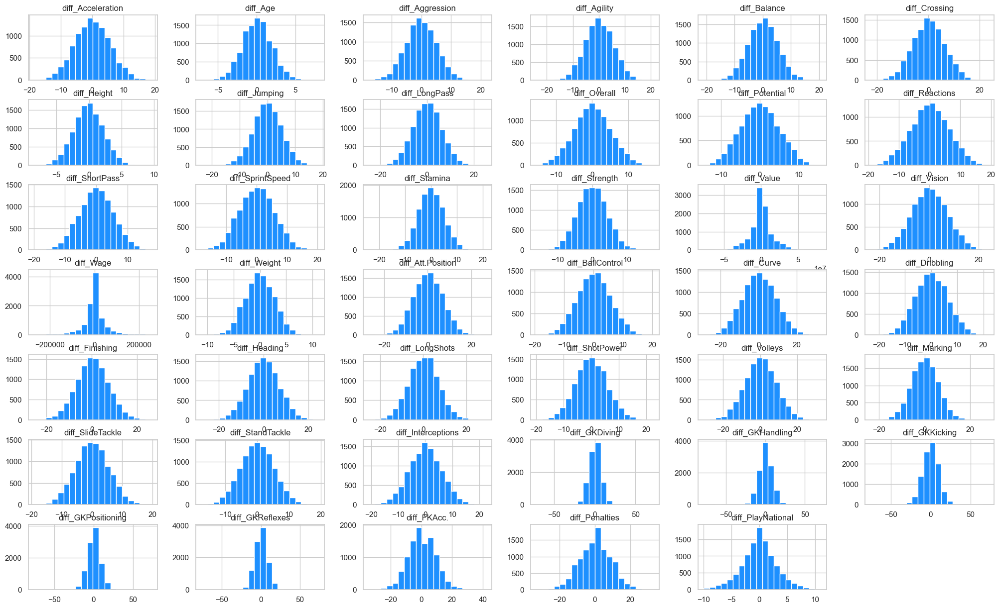

In [214]:
# Histograms of all numeric variables 
%matplotlib inline
plattr_df[numeric_cols[-41:]].hist(bins=20, figsize=(25,15), color = 'dodgerblue')
plt.show()

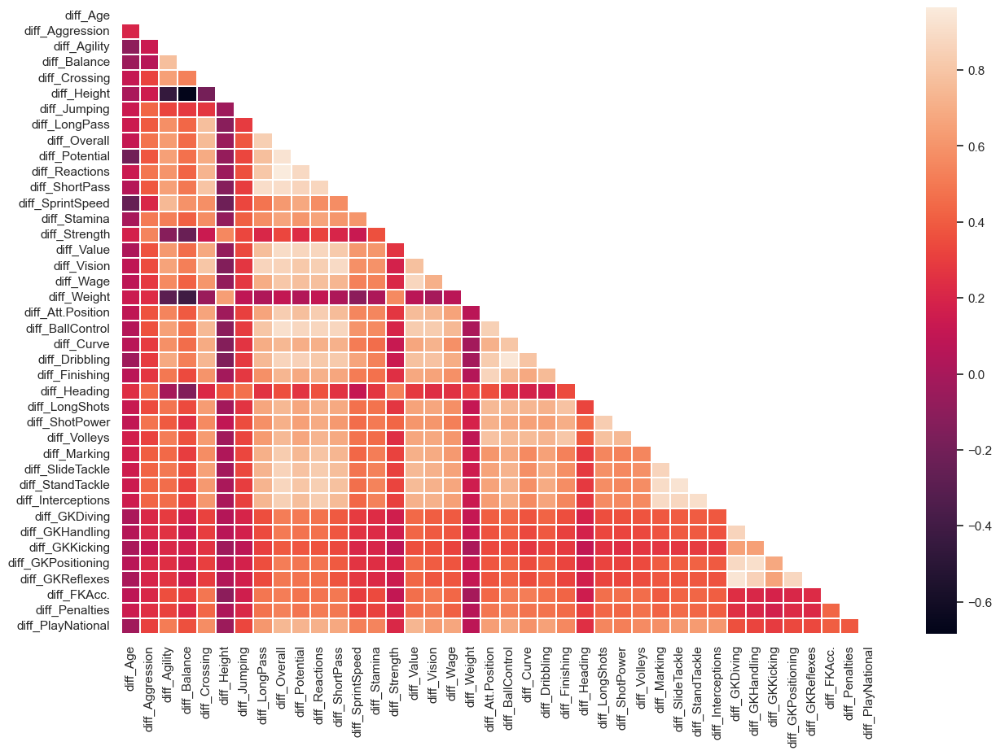

In [215]:
# Correlation Heatmap
corrmat = plattr_df.iloc[:, -41:].corr()
top_corr_features = corrmat.index
matrix = np.triu(corrmat)
plt.figure(figsize=(15,10))
g = sns.heatmap(plattr_df[top_corr_features].corr(), mask=matrix ,linewidths=.15)

##### **Best Model**

In [216]:
# Split train and test sets
X = plattr_df.loc[:, 'league_id':]
y = plattr_df['result'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=14, stratify=y)
# Sets shape
print('X train shape: ', X_train.shape, '. Y train shape: ',y_train.shape, '\nX test shape: ', X_test.shape, '. Y test shape: ', y_test.shape)

# Pre-processing techniques
full_pipeline_std = ColumnTransformer([
    ('num', StandardScaler(), numeric_cols), 
    ('cat_hot', OneHotEncoder(handle_unknown = 'ignore'), cat_cols)
], remainder='passthrough') # Standard scaler + One-Hot encoding
X_tr_std = full_pipeline_std.fit_transform(X_train)
X_te_std = full_pipeline_std.transform(X_test)
print('X_train Shape: ', X_train.shape, '\nX_tr_std Shape: ', X_tr_std.shape)

X train shape:  (8955, 126) . Y train shape:  (8955,) 
X test shape:  (1581, 126) . Y test shape:  (1581,)
X_train Shape:  (8955, 126) 
X_tr_std Shape:  (8955, 164)


Test Accuracy:  0.5420619860847565


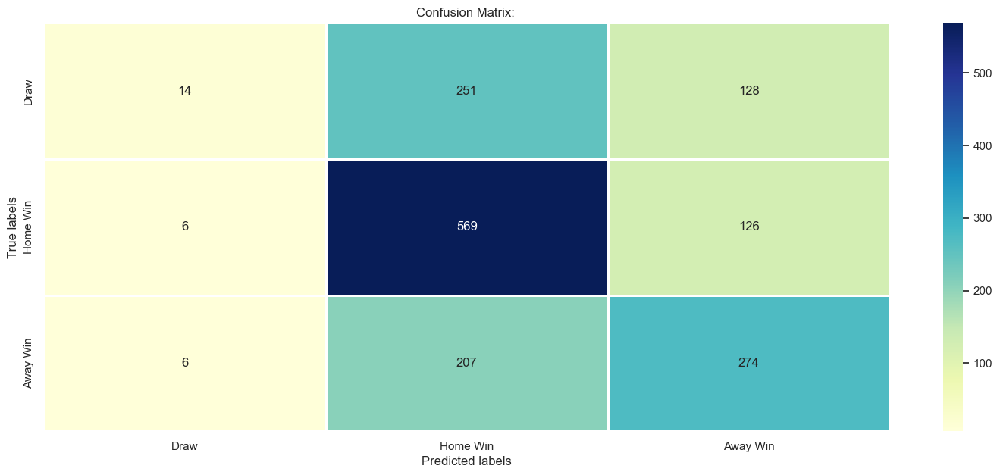

In [217]:
# Model
top_model = LogisticRegression(C=0.01, max_iter=5000, multi_class='multinomial',solver='saga') 
top_model.fit(X_tr_std, y_train)           
y_pred = top_model.predict(X_te_std)
# Model's Accuracy and Confusion Matrix
print('Test Accuracy: ', metrics.accuracy_score(y_test, y_pred))
plot_confusion_matrix(y_pred, y_test, color_map='YlGnBu')